In [1]:
source("base/it-402-dc-data_initial_exploration-base.r")

── Attaching packages ────────────────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.2     ✔ purrr   0.3.4
✔ tibble  3.0.4     ✔ dplyr   1.0.2
✔ tidyr   1.1.2     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.0

── Conflicts ───────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



<p><br /></p>

## Notes

* historical data at https://www.gov.scot/publications/school-statistics-historical-pupil-school-and-teacher-numbers
    * Note the numbers in the roll (1996-2018) differ from the historical series
    * the historical series has detail by year from 1995 but sums only for the full time period
    * Both sets analysed here - mainly to confirm the patterns generally match; however, using the latter as it spans the full time needed and also provides additional historical context

    * special schools and centrally employed not counted - not possible to split secondary stages from primary
<p><br /></p>

* teacher censuses - https://www.gov.scot/publications/summary-statistics-schools-scotland-2020

### School Rolls - 1996 - 2019

In [2]:
school_rolls_1996_2018 <- read_csv("sta_it_402/data//demographic_data/school_rolls_1996-2018.csv", trim_ws = T) %>% #, skip_empty_rows = T) # NOT skipping empty rows... :(
                    filter(rowSums(is.na(.)) != ncol(.))

glimpse(school_rolls_1996_2018)
head(school_rolls_1996_2018)



── Column specification ───────────────────────────────────────────────────────────────────
cols(
  .default = col_number(),
  `LA Code` = col_double(),
  `LA Name` = col_character(),
  Code = col_double(),
  Name = col_character(),
  Sector = col_character(),
  `School Type` = col_character(),
  `2012` = col_character(),
  `2013` = col_double(),
  `2014` = col_double(),
  `2015` = col_double(),
  `2016` = col_double(),
  `2017` = col_double(),
  `2018` = col_double()
)
ℹ Use `spec()` for the full column specifications.


Warning message:
“1 parsing failure.
 row  col               expected actual                                                           file
1359 2016 no trailing characters  1,604 'sta_it_402/data//demographic_data/school_rolls_1996-2018.csv'
”


Rows: 3,358
Columns: 29
$ `LA Code`     <dbl> 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, …
$ `LA Name`     <chr> "Aberdeen City", "Aberdeen City", "Aberdeen City", "Abe…
$ Code          <dbl> 5237521, 5237629, 5237726, 5237823, 5234026, 5238021, 5…
$ Name          <chr> "Abbotswell", "Airyhall", "Ashgrove Children's Centre",…
$ Sector        <chr> "Primary", "Primary", "Primary", "Primary", "Primary", …
$ `School Type` <chr> "Local Authority", "Local Authority", "Local Authority"…
$ `1996`        <dbl> 283, 264, 24, 437, 111, 98, 132, 0, 499, 162, 136, 158,…
$ `1997`        <dbl> 268, 273, 23, 441, 105, 99, 120, 0, 500, 168, 118, 156,…
$ `1998`        <dbl> 283, 275, 26, 431, 125, 104, 102, 0, 499, 196, 122, 157…
$ `1999`        <dbl> 254, 281, 23, 445, 132, 101, 110, 0, 481, 188, 113, 162…
$ `2000`        <dbl> 258, 254, 0, 433, 126, 97, 86, 0, 474, 180, 111, 130, 2…
$ `2001`        <dbl> 246, 256, 0, 422, 127, 79, 99, 0, 464, 173, 101, 121, 2…
$ `2002`        <dbl> 253, 2

LA Code,LA Name,Code,Name,Sector,School Type,1996,1997,1998,1999,⋯,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
100,Aberdeen City,5237521,Abbotswell,Primary,Local Authority,283,268,283,254,⋯,212,203,190,194,188,193,191,201,214,230
100,Aberdeen City,5237629,Airyhall,Primary,Local Authority,264,273,275,281,⋯,308,311,307,322,321,316,339,355,363,353
100,Aberdeen City,5237726,Ashgrove Children's Centre,Primary,Local Authority,24,23,26,23,⋯,0,0,0,0,0,0,0,0,0,0
100,Aberdeen City,5237823,Ashley Road,Primary,Local Authority,437,441,431,445,⋯,392,386,375,378,381,389,375,366,372,397
100,Aberdeen City,5234026,Balgownie,Primary,Local Authority,111,105,125,132,⋯,190,161,167,170,173,184,193,189,210,243
100,Aberdeen City,5238021,Braeside Nursery/Infant School,Primary,Local Authority,98,99,104,101,⋯,0,0,0,0,0,0,0,0,0,0


In [3]:
school_rolls_1996_2018 <- school_rolls_1996_2018 %>%

    #rename_with(., str_to_title) %>%
    rename_with(., ~ (gsub("\\s+", "", .x))) %>%
    #rename_with(., ~ (gsub("LA", "LocalAuthority", .x))) %>%
    rename(LocalAuthorityCode = LACode) %>%
    rename(LocalAuthority = LAName) %>%
    filter(Sector == "Secondary") %>%
    mutate_at(c("LocalAuthorityCode", "LocalAuthority", "Code", "Sector", "SchoolType"), as.factor)

names(school_rolls_1996_2018)

[1] "LocalAuthorityCode" "LocalAuthority"     "Code"              
 [4] "Name"               "Sector"             "SchoolType"        
 [7] "1996"               "1997"               "1998"              
[10] "1999"               "2000"               "2001"              
[13] "2002"               "2003"               "2004"              
[16] "2005"               "2006"               "2007"              
[19] "2008"               "2009"               "2010"              
[22] "2011"               "2012"               "2013"              
[25] "2014"               "2015"               "2016"              
[28] "2017"               "2018"

In [4]:
school_rolls_1996_2018 <- school_rolls_1996_2018 %>%

    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), as.character) %>%
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), parse_number) %>%
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), as.integer) %>%

    pivot_longer(matches(regex("\\b\\d{4}\\b")), names_to = "year", values_to = "roll") %>% 
    mutate_at(c("year"), as.ordered)

glimpse(school_rolls_1996_2018)

Warning message:
“Problem with `mutate()` input `2012`.
ℹ 12 parsing failures.
row col expected actual
 40  -- a number      .
 81  -- a number      .
145  -- a number      .
146  -- a number      .
148  -- a number      .
... ... ........ ......
See problems(...) for more details.

ℹ Input `2012` is `(function (x, na = c("", "NA"), locale = default_locale(), trim_ws = TRUE) ...`.”
Warning message:
“12 parsing failures.
row col expected actual
 40  -- a number      .
 81  -- a number      .
145  -- a number      .
146  -- a number      .
148  -- a number      .
... ... ........ ......
See problems(...) for more details.
”


Rows: 11,592
Columns: 8
$ LocalAuthorityCode <fct> 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, …
$ LocalAuthority     <fct> Aberdeen City, Aberdeen City, Aberdeen City, Aberd…
$ Code               <fct> 5244439, 5244439, 5244439, 5244439, 5244439, 52444…
$ Name               <chr> "Aberdeen Grammar", "Aberdeen Grammar", "Aberdeen …
$ Sector             <fct> Secondary, Secondary, Secondary, Secondary, Second…
$ SchoolType         <fct> Local Authority, Local Authority, Local Authority,…
$ year               <ord> 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 20…
$ roll               <int> 1069, 1059, 1102, 1101, 1113, 1110, 1132, 1136, 11…


In [5]:
levels(school_rolls_1996_2018$year)
base_year <- levels(school_rolls_1996_2018$year)[1]
base_year

[1] "1996" "1997" "1998" "1999" "2000" "2001" "2002" "2003" "2004" "2005"
[11] "2006" "2007" "2008" "2009" "2010" "2011" "2012" "2013" "2014" "2015"
[21] "2016" "2017" "2018"

[1] "1996"

In [6]:
str(school_rolls_1996_2018)

unique(school_rolls_1996_2018$LocalAuthority)
length(unique(school_rolls_1996_2018$LocalAuthority))

tibble [11,592 × 8] (S3: tbl_df/tbl/data.frame)
 $ LocalAuthorityCode: Factor w/ 33 levels "100","110","120",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ LocalAuthority    : Factor w/ 33 levels "Aberdeen City",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ Code              : Factor w/ 504 levels "1002732","1003062",..: 70 70 70 70 70 70 70 70 70 70 ...
 $ Name              : chr [1:11592] "Aberdeen Grammar" "Aberdeen Grammar" "Aberdeen Grammar" "Aberdeen Grammar" ...
 $ Sector            : Factor w/ 1 level "Secondary": 1 1 1 1 1 1 1 1 1 1 ...
 $ SchoolType        : Factor w/ 3 levels "grant aided",..: 3 3 3 3 3 3 3 3 3 3 ...
 $ year              : Ord.factor w/ 23 levels "1996"<"1997"<..: 1 2 3 4 5 6 7 8 9 10 ...
 $ roll              : int [1:11592] 1069 1059 1102 1101 1113 1110 1132 1136 1156 1168 ...


[1] Aberdeen City       Aberdeenshire       Angus              
 [4] Argyll & Bute       Clackmannanshire    Dumfries & Galloway
 [7] Dundee City         East Ayrshire       East Dunbartonshire
[10] East Lothian        East Renfrewshire   Edinburgh, City of 
[13] Eilean Siar         Falkirk             Fife               
[16] Glasgow City        Highland            Inverclyde         
[19] Midlothian          Moray               North Ayrshire     
[22] North Lanarkshire   Orkney Islands      Perth & Kinross    
[25] Renfrewshire        Scottish Borders    Shetland Islands   
[28] South Ayrshire      South Lanarkshire   Stirling           
[31] West Dunbartonshire West Lothian        Grant Maintained   
33 Levels: Aberdeen City Aberdeenshire Angus Argyll & Bute ... West Lothian

[1] 33

In [7]:
index_factors_by_local_authority <- school_rolls_1996_2018 %>%

    group_by(LocalAuthorityCode, LocalAuthority, year) %>%
    summarise(roll = sum(roll, na.rm = TRUE)) %>%

    left_join(school_rolls_1996_2018 %>%
              
                  filter(year == base_year) %>%
                  group_by(LocalAuthorityCode, LocalAuthority) %>%
                  summarise(base_year_roll = sum(roll, na.rm = TRUE))
              ) %>%

    mutate(index_factor = roll / base_year_roll)
    
index_factors_by_local_authority[c(1:6, 34:39), ]


`summarise()` regrouping output by 'LocalAuthorityCode', 'LocalAuthority' (override with `.groups` argument)

`summarise()` regrouping output by 'LocalAuthorityCode' (override with `.groups` argument)

Joining, by = c("LocalAuthorityCode", "LocalAuthority")



LocalAuthorityCode,LocalAuthority,year,roll,base_year_roll,index_factor
<fct>,<fct>,<ord>,<int>,<int>,<dbl>
100,Aberdeen City,1996,12564,12564,1.0000000
100,Aberdeen City,1997,12736,12564,1.0136899
100,Aberdeen City,1998,12698,12564,1.0106654
100,Aberdeen City,1999,12632,12564,1.0054123
100,Aberdeen City,2000,12564,12564,1.0000000
100,Aberdeen City,2001,12589,12564,1.0019898
110,Aberdeenshire,2006,15766,15255,1.0334972
110,Aberdeenshire,2007,15517,15255,1.0171747
110,Aberdeenshire,2008,15087,15255,0.9889872


In [8]:
index_factors_rolls_1996_2018 <- school_rolls_1996_2018 %>%

    group_by(year) %>%
    summarise(roll = sum(roll, na.rm = TRUE)) %>%

    mutate(base_year_roll = school_rolls_1996_2018 %>%
               filter(year == base_year) %>%
               summarise(base_year_roll = sum(roll, na.rm = TRUE)) %>%
               as.integer
              ) %>%

    mutate(index_factor = roll / base_year_roll)
    
index_factors_rolls_1996_2018

`summarise()` ungrouping output (override with `.groups` argument)



year,roll,base_year_roll,index_factor
<ord>,<int>,<int>,<dbl>
1996,335044,335044,1.0000000
1997,333147,335044,0.9943381
1998,331144,335044,0.9883597
1999,333074,335044,0.9941202
2000,335241,335044,1.0005880
2001,333998,335044,0.9968780
2002,334457,335044,0.9982480
2003,336032,335044,1.0029489
2004,335454,335044,1.0012237


mean,min,max
<dbl>,<int>,<int>
314681.2,279379,336032


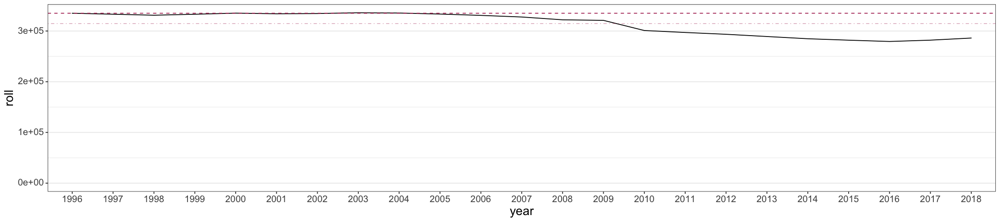

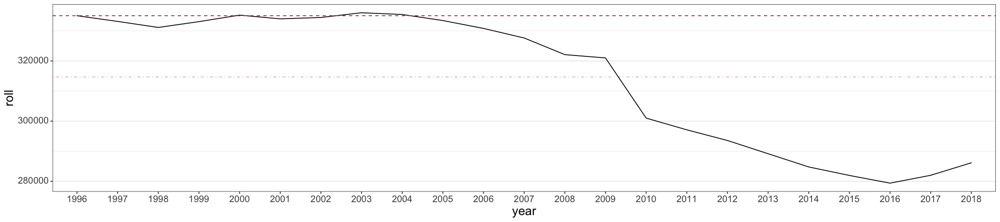

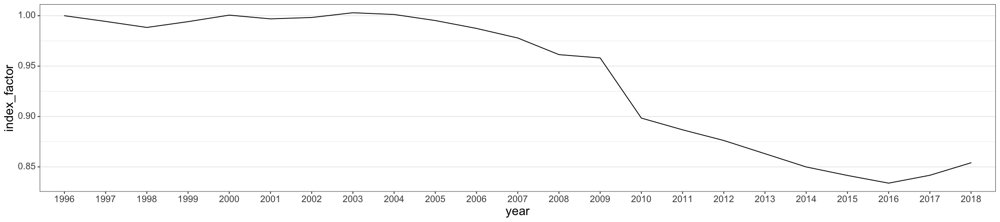

In [9]:
options(repr.plot.width = 18, repr.plot.height = 4)

summary_lines <- index_factors_rolls_1996_2018 %>%
    summarise(
        mean = mean(roll),
        min = min(roll),
        max = max(roll)
    )
summary_lines


index_factors_rolls_1996_2018 %>%

    ggplot(aes(x = year, y = roll, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = base_year_roll), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +
        #geom_hline(aes(yintercept = summary_lines$min), colour = "maroon", linetype = "dashed") +
        #geom_linerange(aes(x = NULL, y = mean, xmin = min, xmax = max), data = summary_lines) + 
        expand_limits(y = 0) + 
        
        #scale_y_continuous("Percentage Take-Up of Computing by Females", labels = function(x) scales::percent(abs(x))) + 
        #scale_linetype(guide = FALSE) +
        #scale_colour_discrete(breaks = c("PercentageOfStudents", "PercentageChangeFemales", "GrowthRateFemales")) +
        dressCodeTheme 


index_factors_rolls_1996_2018 %>%

    ggplot(aes(x = year, y = roll, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = base_year_roll), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +
        
        dressCodeTheme 



index_factors_rolls_1996_2018 %>%

    ggplot(aes(x = year, y = index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        dressCodeTheme 


### Census - 1966 - 2020

In [10]:
census_1966_2020 <- read_csv("sta_it_402/data//demographic_data/pupil_teacher_census_1966-2020.csv", trim_ws = T) %>% #, skip_empty_rows = T) # NOT skipping empty rows... :(
                        filter(rowSums(is.na(.)) != ncol(.))

glimpse(census_1966_2020)
head(census_1966_2020)




── Column specification ───────────────────────────────────────────────────────────────────
cols(
  Year = col_double(),
  `primary-schools` = col_number(),
  `primary-pupils` = col_number(),
  `primary-teachers-FTE` = col_number(),
  `secondary-schools` = col_double(),
  `secondary-pupils` = col_number(),
  `secondary-teachers-FTE` = col_number(),
  `special-schools` = col_double(),
  `special-pupils` = col_number(),
  `special-teachers-FTE` = col_number(),
  `centrally_employed-teachers-FTE` = col_character()
)




Rows: 55
Columns: 11
$ Year                              <dbl> 1966, 1967, 1968, 1969, 1970, 1971,…
$ `primary-schools`                 <dbl> NA, 2647, 2622, 2587, 2521, 2526, 2…
$ `primary-pupils`                  <dbl> 601186, 606082, 614780, 622647, 631…
$ `primary-teachers-FTE`            <dbl> NA, 20718, 21696, 21854, 22993, 228…
$ `secondary-schools`               <dbl> NA, 665, 640, 616, 441, 541, 516, 4…
$ `secondary-pupils`                <dbl> 283592, 288054, 295625, 307185, 317…
$ `secondary-teachers-FTE`          <dbl> NA, 19177, 20541, 20259, 21091, 208…
$ `special-schools`                 <dbl> NA, 204, 207, 211, 210, 223, 230, 2…
$ `special-pupils`                  <dbl> 11274, 11641, 11820, 12073, 12190, …
$ `special-teachers-FTE`            <dbl> NA, 1055, 994, 961, 952, 1169, 1236…
$ `centrally_employed-teachers-FTE` <chr> NA, NA, NA, NA, NA, NA, NA, NA, NA,…


Year,primary-schools,primary-pupils,primary-teachers-FTE,secondary-schools,secondary-pupils,secondary-teachers-FTE,special-schools,special-pupils,special-teachers-FTE,centrally_employed-teachers-FTE
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1966,NA,601186,NA,NA,283592,NA,NA,11274,NA,NA
1967,2647,606082,20718,665,288054,19177,204,11641,1055,NA
1968,2622,614780,21696,640,295625,20541,207,11820,994,NA
1969,2587,622647,21854,616,307185,20259,211,12073,961,NA
1970,2521,631181,22993,441,317027,21091,210,12190,952,NA
1971,2526,636250,22878,541,327514,20856,223,12450,1169,NA


In [11]:
census_1966_2020 <- census_1966_2020 %>%

    mutate_at(vars(everything()), as.integer) %>%
    mutate_at("Year", as.ordered)

head(census_1966_2020, 15)

Warning message:
“Problem with `mutate()` input `centrally_employed-teachers-FTE`.
ℹ NAs introduced by coercion
ℹ Input `centrally_employed-teachers-FTE` is `.Primitive("as.integer")(`centrally_employed-teachers-FTE`)`.”
Warning message in mask$eval_all_mutate(dots[[i]]):
“NAs introduced by coercion”


Year,primary-schools,primary-pupils,primary-teachers-FTE,secondary-schools,secondary-pupils,secondary-teachers-FTE,special-schools,special-pupils,special-teachers-FTE,centrally_employed-teachers-FTE
<ord>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1966,NA,601186,NA,NA,283592,NA,NA,11274,NA,NA
1967,2647,606082,20718,665,288054,19177,204,11641,1055,NA
1968,2622,614780,21696,640,295625,20541,207,11820,994,NA
1969,2587,622647,21854,616,307185,20259,211,12073,961,NA
1970,2521,631181,22993,441,317027,21091,210,12190,952,NA
1971,2526,636250,22878,541,327514,20856,223,12450,1169,NA
1972,2522,642778,24147,516,337535,21941,230,12607,1236,NA
1973,2506,644352,25072,492,351543,23403,236,12665,1306,NA
1974,2524,643095,25945,478,384786,24986,238,12726,1157,NA


In [12]:
census_1966_2020 <- census_1966_2020 %>%
    
    rename_with(., ~ gsub("-", "_", .))

In [13]:
base_year <- min(census_1966_2020$Year)
base_year

[1] 1966
55 Levels: 1966 < 1967 < 1968 < 1969 < 1970 < 1971 < 1972 < 1973 < ... < 2020

In [14]:
census_1966_2020 %>%
               filter(Year == base_year) %>%
                select(secondary_pupils) %>%
                as.integer

[1] 283592

In [15]:
index_factors_census_1966_2020 <- census_1966_2020 %>%

    select(c(Year, secondary_schools, secondary_pupils)) %>%

    mutate(base_year_census = census_1966_2020 %>%
               filter(Year == base_year) %>%
               select(secondary_pupils) %>%
               as.integer
              ) %>%

    mutate(index_factor = secondary_pupils / base_year_census)
    
head(index_factors_census_1966_2020)

Year,secondary_schools,secondary_pupils,base_year_census,index_factor
<ord>,<int>,<int>,<int>,<dbl>
1966,NA,283592,283592,1.000000
1967,665,288054,283592,1.015734
1968,640,295625,283592,1.042431
1969,616,307185,283592,1.083193
1970,441,317027,283592,1.117898
1971,541,327514,283592,1.154877


mean,min,max
<dbl>,<int>,<int>
328802.7,280983,422263


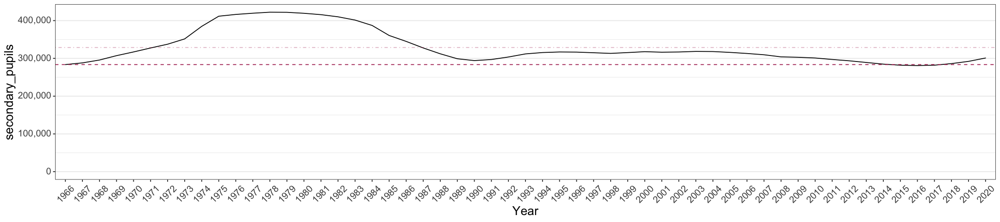

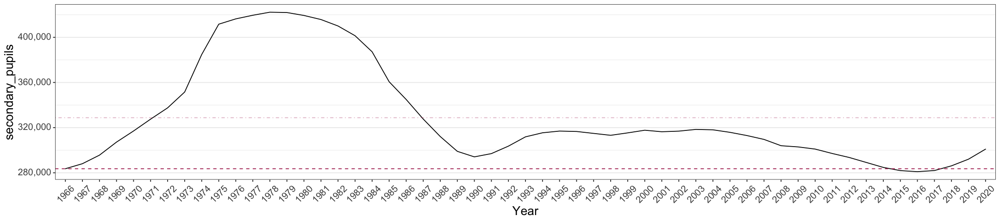

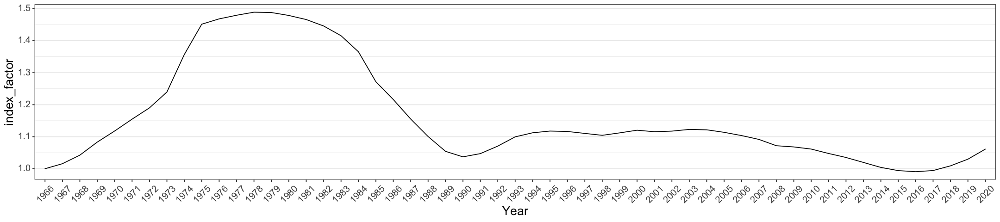

In [16]:
options(repr.plot.width = 18, repr.plot.height = 4)

summary_lines <- index_factors_census_1966_2020 %>%
    summarise(
        mean = mean(secondary_pupils),
        min = min(secondary_pupils),
        max = max(secondary_pupils)
    )
summary_lines


index_factors_census_1966_2020 %>%

    ggplot(aes(x = Year, y = secondary_pupils, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = base_year_census), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +
        expand_limits(y = 0) + 

        scale_y_continuous(labels = scales::comma) + #stop auto-conversion to scientific mode
        #scale_x_continuous(breaks = seq(min(index_factors_census_1966_2020$Year), max(index_factors_census_1966_2020$Year), 1)) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


index_factors_census_1966_2020 %>%

    ggplot(aes(x = Year, y = secondary_pupils, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = base_year_census), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +

        scale_y_continuous(labels = scales::comma) + #stop auto-conversion to scientific mode
        #scale_x_continuous(breaks = seq(min(index_factors_census_1966_2020$Year), max(index_factors_census_1966_2020$Year), 1)) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 



index_factors_census_1966_2020 %>%

    ggplot(aes(x = Year, y = index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        #scale_x_continuous(breaks = seq(min(index_factors_census_1966_2020$Year), max(index_factors_census_1966_2020$Year), 1)) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 



In [17]:
# revert back to base year falling within both datasets
# - use same base year as school rolls 1996-2018 so can directly compare

base_year <- as.integer(levels(school_rolls_1996_2018$year)[1])
base_year

[1] 1996

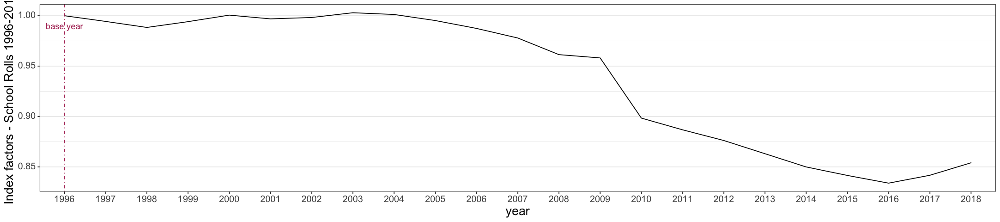

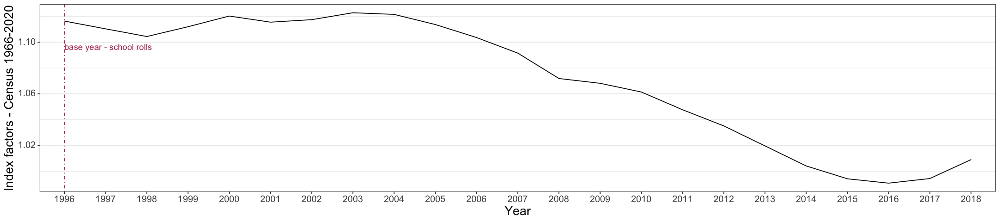

In [18]:
index_factors_rolls_1996_2018 %>%

    ggplot(aes(x = year, y = index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        geom_vline(aes(xintercept = as.character(base_year)), colour = "maroon", alpha = 0.95, linetype = "dotdash")+
        annotate(geom = "text", 
                 x = as.character(base_year), 
                 y = as.numeric(index_factors_rolls_1996_2018[which(index_factors_rolls_1996_2018$year == base_year), c("index_factor")]) - 0.01, 
                 label = "base year",  
                 colour = "maroon") +
        ylab("Index factors - School Rolls 1996-2018") + 
        dressCodeTheme 


index_factors_census_1966_2020 %>%
    filter((Year >= 1996) & (Year <= 2018)) %>%
        #index_factors_census_1966_2020, between(min(index_factors_rolls_1996_2018$year), max(index_factors_rolls_1996_2018$year)) %>%

    ggplot(aes(x = Year, y = index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        geom_vline(aes(xintercept = as.character(base_year)), colour = "maroon", alpha = 0.95, linetype = "dotdash") +
        annotate(geom = "text", 
                 x = as.character(base_year), 
                 y = as.numeric(index_factors_census_1966_2020[which(index_factors_census_1966_2020$Year == base_year), 
                                                                 c("index_factor")]) - 0.02, 
                 label = "base year - school rolls", hjust = "left",
                 colour = "maroon") +
        ylab("Index factors - Census 1966-2020") + 
        dressCodeTheme


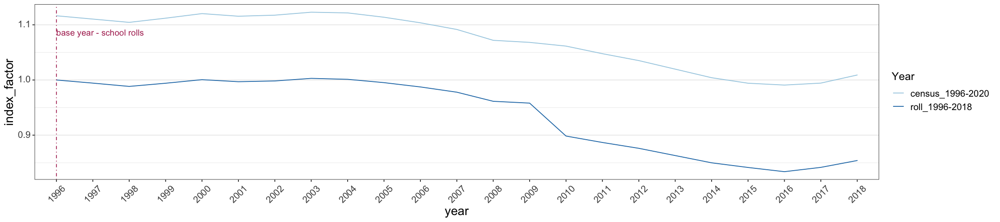

In [19]:
bind_rows(

    index_factors_rolls_1996_2018 %>%
        mutate(dataset = "roll_1996-2018") %>%
        mutate_at("year", as.character) %>%
        mutate_at("year", as.integer) %>%
        select(dataset, everything()),

    index_factors_census_1966_2020 %>%

        rename(year = Year) %>%
        mutate_at("year", as.character) %>%
        mutate_at("year", as.integer) %>%
        rename(base_year_roll = base_year_census) %>%
        rename(roll = secondary_pupils) %>%
        mutate(dataset = "census_1996-2020") %>%
        select(dataset, everything())
    
    ) %>%
    mutate_at("year", as.ordered) %>%
    filter((year >= 1996) & (year <= 2018)) %>%

    ggplot(aes(x = year, y = index_factor, group = dataset, colour = dataset)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        geom_vline(aes(xintercept = as.character(base_year)), colour = "maroon", alpha = 0.95, linetype = "dotdash") +
        annotate(geom = "text", 
                 x = as.character(base_year), 
                 y = as.numeric(index_factors_census_1966_2020[which(index_factors_census_1966_2020$Year == base_year), 
                                                                 c("index_factor")]) - 0.03, 
                 label = "base year - school rolls", hjust = "left",
                 colour = "maroon") +
         
        scale_colour_brewer(name = "Year", palette = "Paired") +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 




In [20]:
# reindex to use same base year as school rolls 1996-2018 so can directly compare

index_factors_census_1966_2020 <- census_1966_2020 %>%

    select(c(Year, secondary_schools, secondary_pupils)) %>%

    mutate(base_year_census = census_1966_2020 %>%
               filter(Year == base_year) %>%
               select(secondary_pupils) %>%
               as.integer
              ) %>%

    mutate(index_factor = secondary_pupils / base_year_census)
    
head(census_1966_2020)
head(index_factors_census_1966_2020)

index_factors_census_1966_2020 %>%
    filter((Year >= (base_year - 5)) & (Year <= (base_year + 5)))


Year,primary_schools,primary_pupils,primary_teachers_FTE,secondary_schools,secondary_pupils,secondary_teachers_FTE,special_schools,special_pupils,special_teachers_FTE,centrally_employed_teachers_FTE
<ord>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1966,NA,601186,NA,NA,283592,NA,NA,11274,NA,NA
1967,2647,606082,20718,665,288054,19177,204,11641,1055,NA
1968,2622,614780,21696,640,295625,20541,207,11820,994,NA
1969,2587,622647,21854,616,307185,20259,211,12073,961,NA
1970,2521,631181,22993,441,317027,21091,210,12190,952,NA
1971,2526,636250,22878,541,327514,20856,223,12450,1169,NA


Year,secondary_schools,secondary_pupils,base_year_census,index_factor
<ord>,<int>,<int>,<int>,<dbl>
1966,NA,283592,316594,0.8957592
1967,665,288054,316594,0.9098530
1968,640,295625,316594,0.9337669
1969,616,307185,316594,0.9702805
1970,441,317027,316594,1.0013677
1971,541,327514,316594,1.0344921


Year,secondary_schools,secondary_pupils,base_year_census,index_factor
<ord>,<int>,<int>,<int>,<dbl>
1991,420,296991,316594,0.9380816
1992,414,303624,316594,0.9590327
1993,410,311833,316594,0.9849618
1994,407,315430,316594,0.9963234
1995,406,316957,316594,1.0011466
1996,403,316594,316594,1.0000000
1997,401,314889,316594,0.9946146
1998,392,313204,316594,0.9892923
1999,389,315356,316594,0.9960896


In [21]:
tmp_df <- bind_rows(

    index_factors_rolls_1996_2018 %>%
        mutate(dataset = "roll_1996-2018") %>%
        mutate_at("year", as.character) %>%
        mutate_at("year", as.integer) %>%
        select(dataset, everything()),

    index_factors_census_1966_2020 %>%

        rename(year = Year) %>%
        mutate_at("year", as.character) %>%
        mutate_at("year", as.integer) %>%
        rename(base_year_roll = base_year_census) %>%
        rename(roll = secondary_pupils) %>%
        mutate(dataset = "census_1996-2020") %>%
        select(dataset, everything())
    
    ) %>%
    mutate_at("year", as.ordered) 

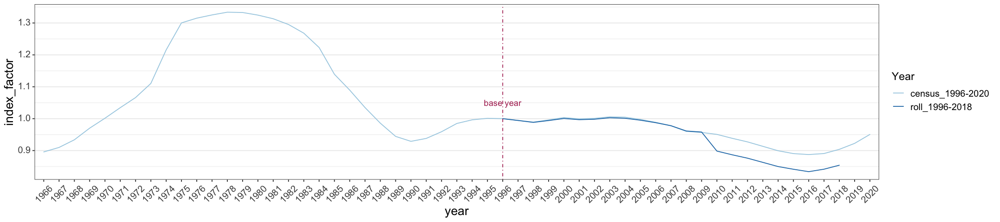

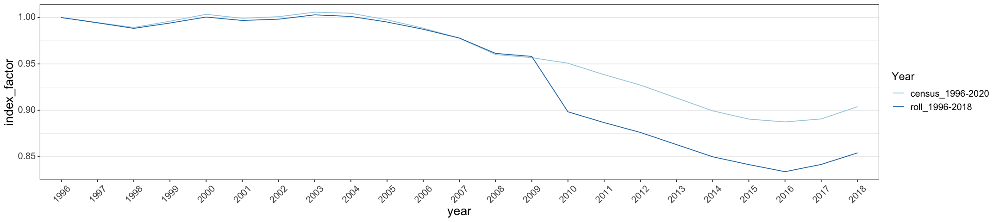

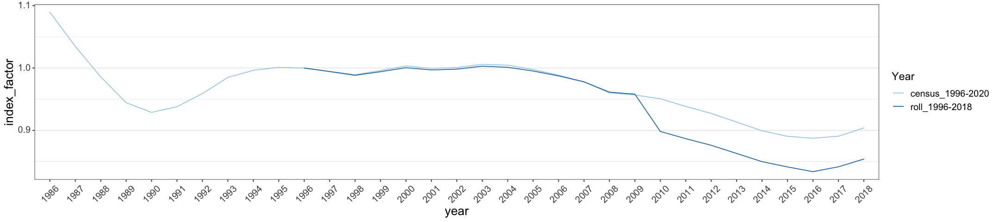

In [22]:
tmp_df %>%

    ggplot(aes(x = year, y = index_factor, group = dataset, colour = dataset)) +  
        geom_line(lineend = 'round', linejoin = 'round') +

        geom_vline(aes(xintercept = as.character(base_year)), colour = "maroon", alpha = 0.95, linetype = "dotdash") +
        annotate(geom = "text", 
                 x = as.character(base_year), 
                 y = as.numeric(tmp_df[which(tmp_df$year == base_year), c("index_factor")][1, ]) + 0.05, 
                 label = "base year",  
                 colour = "maroon") +

        scale_colour_brewer(name = "Year", palette = "Paired") + #, direction = -1) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 


tmp_df %>%
    filter((year >= 1996) & (year <= 2018)) %>%

    ggplot(aes(x = year, y = index_factor, group = dataset, colour = dataset)) +  
        geom_line(lineend = 'round', linejoin = 'round') +

        scale_colour_brewer(name = "Year", palette = "Paired") +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 


tmp_df %>%
    filter((year >= 1986) & (year <= 2018)) %>%

    ggplot(aes(x = year, y = index_factor, group = dataset, colour = dataset)) +  
        geom_line(lineend = 'round', linejoin = 'round') +

        scale_colour_brewer(name = "Year", palette = "Paired") +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 

### Local Authority Censuses  - Teachers & Pupils 1995 - 2020

    * data from historical censuses 1966-2020 - local authority data captured from 1995

In [23]:
head(census_1966_2020)
head(index_factors_by_local_authority)

Year,primary_schools,primary_pupils,primary_teachers_FTE,secondary_schools,secondary_pupils,secondary_teachers_FTE,special_schools,special_pupils,special_teachers_FTE,centrally_employed_teachers_FTE
<ord>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1966,NA,601186,NA,NA,283592,NA,NA,11274,NA,NA
1967,2647,606082,20718,665,288054,19177,204,11641,1055,NA
1968,2622,614780,21696,640,295625,20541,207,11820,994,NA
1969,2587,622647,21854,616,307185,20259,211,12073,961,NA
1970,2521,631181,22993,441,317027,21091,210,12190,952,NA
1971,2526,636250,22878,541,327514,20856,223,12450,1169,NA


LocalAuthorityCode,LocalAuthority,year,roll,base_year_roll,index_factor
<fct>,<fct>,<ord>,<int>,<int>,<dbl>
100,Aberdeen City,1996,12564,12564,1.000000
100,Aberdeen City,1997,12736,12564,1.013690
100,Aberdeen City,1998,12698,12564,1.010665
100,Aberdeen City,1999,12632,12564,1.005412
100,Aberdeen City,2000,12564,12564,1.000000
100,Aberdeen City,2001,12589,12564,1.001990


#### Pupil Cohorts

In [172]:
getCohort <- 
    function(stage, year) {
        
        if (!str_detect(stage, "^\\bS[1-6]\\b$") | !str_detect(year, "\\b\\d{4}\\b"))
            return(NA)
        
        cohort <- as.integer(year - (as.integer(str_sub(stage, 2, 2)) - 1))     
        invisible(cohort)        
    }


In [173]:
getCohortLabel <- 
    function(stage, year) {               
        
        if (!str_detect(stage, "^\\bS[1-6]\\b$") | !str_detect(year, "\\b\\d{4}\\b"))
            return(NA)
        # don't get this - fails correctly when called independently but doesn't in df
        
        cohort <- as.integer(year - (as.integer(str_sub(stage, 2, 2)) - 1))  
        if (is.na(cohort)) 
            return(NA)
        
        invisible(paste("S1", cohort, sep = "-"))                
    }
        

(getCohortLabel("S1", 1995))
(getCohortLabel("S2", 1995))
(getCohortLabel("S2", 1996))
(getCohortLabel("D2", 1995))
(getCohortLabel("special_units", 1995))

[1] "S1-1995"

[1] "S1-1994"

[1] "S1-1995"

[1] NA

[1] NA

In [177]:
historical_census_pupils_by_la_and_stage_1995_2020 <- read_csv("sta_it_402/data/demographic_data/sec_pupils_la_census_by_level_1995-2020.csv", trim_ws = T) %>% #, skip_empty_rows = T) # NOT skipping empty rows... :(
                    filter(rowSums(is.na(.)) != ncol(.))

glimpse(historical_census_pupils_by_la_and_stage_1995_2020)
head(historical_census_pupils_by_la_and_stage_1995_2020)



── Column specification ───────────────────────────────────────────────────────────────────
cols(
  .default = col_number(),
  LocalAuthority = col_character(),
  `1995-special_units` = col_double(),
  `1996-special_units` = col_double(),
  `1997-special_units` = col_double(),
  `1998-special_units` = col_double(),
  `1999-special_units` = col_character(),
  `2000-special_units` = col_character(),
  `2001-special_units` = col_character(),
  `2002-StageNotKnown` = col_double(),
  `2003-StageNotKnown` = col_double()
)
ℹ Use `spec()` for the full column specifications.




Rows: 32
Columns: 166
$ LocalAuthority       <chr> "Aberdeen City", "Aberdeenshire", "Angus", "Argy…
$ `1995-S1`            <dbl> 2111, 2957, 1422, 1053, 3469, 555, 1746, 1709, 1…
$ `1995-S2`            <dbl> 2210, 2797, 1373, 1071, 3531, 566, 1846, 1693, 1…
$ `1995-S3`            <dbl> 2203, 3001, 1424, 1075, 3547, 556, 1921, 1806, 1…
$ `1995-S4`            <dbl> 2129, 3027, 1395, 1069, 3540, 598, 1862, 1736, 1…
$ `1995-S5`            <dbl> 1635, 2329, 1004, 927, 2828, 416, 1314, 1230, 11…
$ `1995-S6`            <dbl> 747, 1186, 582, 526, 1421, 243, 796, 632, 624, 7…
$ `1995-special_units` <dbl> 36, 44, 8, 9, 14, 10, 37, 36, NA, NA, NA, NA, 10…
$ `1996-S1`            <dbl> 2160, 2817, 1412, 1001, 3691, 559, 1912, 1776, 1…
$ `1996-S2`            <dbl> 2120, 2930, 1414, 1054, 3437, 548, 1731, 1723, 1…
$ `1996-S3`            <dbl> 2206, 2801, 1343, 1068, 3517, 572, 1840, 1710, 1…
$ `1996-S4`            <dbl> 2173, 2983, 1414, 1060, 3488, 550, 1909, 1799, 1…
$ `1996-S5`            <dbl> 1

LocalAuthority,1995-S1,1995-S2,1995-S3,1995-S4,1995-S5,1995-S6,1995-special_units,1996-S1,1996-S2,⋯,2019-S3,2019-S4,2019-S5,2019-S6,2020-S1,2020-S2,2020-S3,2020-S4,2020-S5,2020-S6
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Aberdeen City,2111,2210,2203,2129,1635,747,36,2160,2120,⋯,1719,1615,1289,815,1930,1890,1794,1736,1432,814
Aberdeenshire,2957,2797,3001,3027,2329,1186,44,2817,2930,⋯,2719,2727,2224,1402,2924,2840,2867,2722,2326,1453
Angus,1422,1373,1424,1395,1004,582,8,1412,1414,⋯,1214,1174,1050,606,1323,1272,1186,1215,986,731
Argyll & Bute,1053,1071,1075,1069,927,526,9,1001,1054,⋯,778,830,705,463,854,806,804,772,770,523
City of Edinburgh,3469,3531,3547,3540,2828,1421,14,3691,3437,⋯,3528,3334,2956,2189,4125,4018,3746,3549,3047,2384
Clackmannanshire,555,566,556,598,416,243,10,559,548,⋯,457,463,362,272,518,537,465,451,412,233


In [178]:
historical_census_pupils_by_la_and_stage_1995_2020 <- historical_census_pupils_by_la_and_stage_1995_2020 %>%
    
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), as.character) %>%
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), parse_number) %>%
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), as.integer) %>%

    pivot_longer(matches(regex("\\b\\d{4}\\b")), names_to = "year", values_to = "roll") %>%
    separate("year", c("year", "stage"), extra = "merge") %>%
    mutate_at(vars(LocalAuthority, stage), as.factor) %>%
    mutate_at(c("year"), as.ordered) %>%

    mutate(cohort = getCohort(stage, as.integer(as.character(year)))) %>%
    relocate(cohort, .after = stage)

head(historical_census_pupils_by_la_and_stage_1995_2020, 15)


Warning message:
“Problem with `mutate()` input `1999-special_units`.
ℹ 1 parsing failure.
row col expected actual
  3  -- a number      .

ℹ Input `1999-special_units` is `(function (x, na = c("", "NA"), locale = default_locale(), trim_ws = TRUE) ...`.”
Warning message:
“1 parsing failure.
row col expected actual
  3  -- a number      .
”
Warning message:
“Problem with `mutate()` input `2000-special_units`.
ℹ 2 parsing failures.
row col expected actual
 29  -- a number      .
 31  -- a number      .

ℹ Input `2000-special_units` is `(function (x, na = c("", "NA"), locale = default_locale(), trim_ws = TRUE) ...`.”
Warning message:
“2 parsing failures.
row col expected actual
 29  -- a number      .
 31  -- a number      .
”
Warning message:
“Problem with `mutate()` input `2001-special_units`.
ℹ 1 parsing failure.
row col expected actual
 31  -- a number      .

ℹ Input `2001-special_units` is `(function (x, na = c("", "NA"), locale = default_locale(), trim_ws = TRUE) ...`.”
Warning mes

LocalAuthority,year,stage,cohort,roll
<fct>,<ord>,<fct>,<int>,<int>
Aberdeen City,1995,S1,1995,2111
Aberdeen City,1995,S2,1994,2210
Aberdeen City,1995,S3,1993,2203
Aberdeen City,1995,S4,1992,2129
Aberdeen City,1995,S5,1991,1635
Aberdeen City,1995,S6,1990,747
Aberdeen City,1995,special_units,NA,36
Aberdeen City,1996,S1,1996,2160
Aberdeen City,1996,S2,1995,2120


Warning message:
“Problem with `mutate()` input `cohort`.
ℹ the condition has length > 1 and only the first element will be used
ℹ Input `cohort` is `getCohort(stage, as.integer(as.character(year)))`.”
Warning message in if (!str_detect(stage, "^\\bS[1-6]\\b$") | !str_detect(year, :
“the condition has length > 1 and only the first element will be used”
Warning message:
“Problem with `mutate()` input `cohortLabel`.
ℹ the condition has length > 1 and only the first element will be used
ℹ Input `cohortLabel` is `getCohortLabel(stage, as.integer(as.character(year)))`.”
Warning message in if (!str_detect(stage, "^\\bS[1-6]\\b$") | !str_detect(year, :
“the condition has length > 1 and only the first element will be used”
Warning message:
“Problem with `mutate()` input `cohortLabel`.
ℹ the condition has length > 1 and only the first element will be used
ℹ Input `cohortLabel` is `getCohortLabel(stage, as.integer(as.character(year)))`.”
Warning message in if (is.na(cohort)) return(NA):
“the con

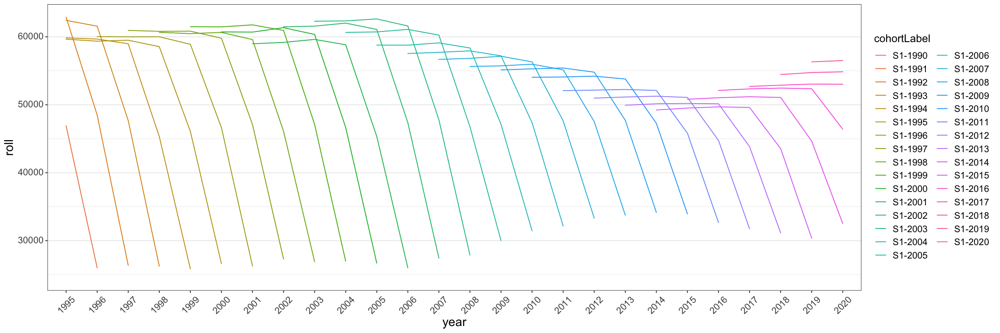

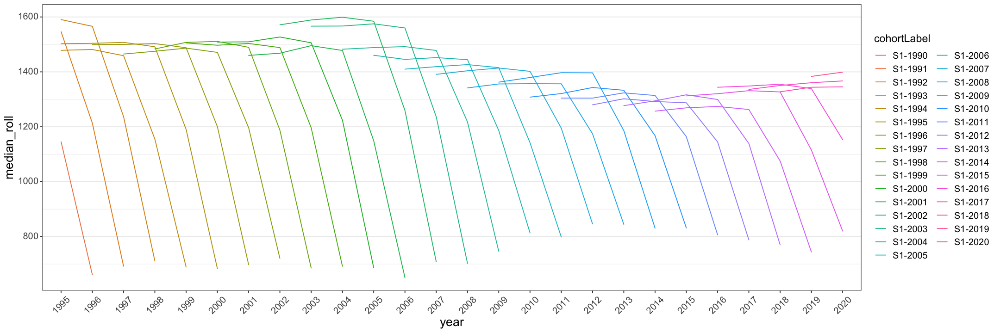

In [179]:

options(repr.plot.width = 18, repr.plot.height = 6)


tmp_df <- historical_census_pupils_by_la_and_stage_1995_2020 %>%

    drop_na(cohort) %>%
    mutate(cohort = getCohort(stage, as.integer(as.character(year)))) %>%
    mutate(cohortLabel = getCohortLabel(stage, as.integer(as.character(year)))) %>%
    relocate(cohortLabel, .after = stage) %>%
    relocate(cohort, .after = stage) %>%

    group_by(year, stage, cohort, cohortLabel) %>%
    summarise(median_roll = median(roll),
              roll = sum(roll)) #%>%
    #arrange(LocalAuthority, year, stage, desc(cohort)) %>%
    #mutate(lead = lead(cohortLabel))

tmp_df %>%

    ggplot(aes(x = year, y = roll, group = cohortLabel, colour = cohortLabel)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        #expand_limits(y = 0) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


tmp_df %>%

    ggplot(aes(x = year, y = median_roll, group = cohortLabel, colour = cohortLabel)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        #expand_limits(y = 0) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


In [180]:
index_factors_by_local_authority_pupils <- historical_census_pupils_by_la_and_stage_1995_2020 %>%

    left_join(historical_census_pupils_by_la_and_stage_1995_2020 %>%
              
                  filter(year == base_year) %>%
                  mutate(base_year_census = roll) %>%
                  select(LocalAuthority, stage, base_year_census)
              ) %>%

    mutate(index_factor = roll / base_year_census) 
    
index_factors_by_local_authority_pupils[c(8:16, 167:179), ]


Joining, by = c("LocalAuthority", "stage")



LocalAuthority,year,stage,cohort,roll,base_year_census,index_factor
<fct>,<ord>,<fct>,<int>,<int>,<int>,<dbl>
Aberdeen City,1996,S1,1996,2160,2160,1.0000000
Aberdeen City,1996,S2,1995,2120,2120,1.0000000
Aberdeen City,1996,S3,1994,2206,2206,1.0000000
Aberdeen City,1996,S4,1993,2173,2173,1.0000000
Aberdeen City,1996,S5,1992,1554,1554,1.0000000
Aberdeen City,1996,S6,1991,847,847,1.0000000
Aberdeen City,1996,special_units,NA,14,14,1.0000000
Aberdeen City,1997,S1,1997,2246,2160,1.0398148
Aberdeen City,1997,S2,1996,2131,2120,1.0051887


median,mean,min,max,median_base_year_census,mean_base_year_census
<dbl>,<dbl>,<int>,<int>,<int>,<dbl>
1237,1497.876,0,6209,NA,NA


`summarise()` regrouping output by 'LocalAuthority' (override with `.groups` argument)



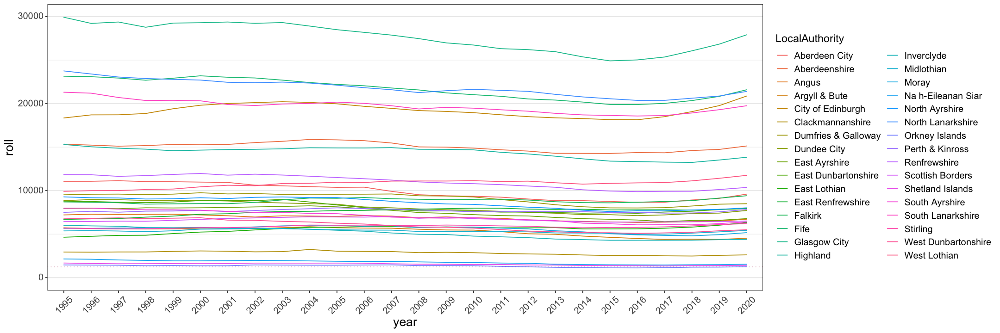

`summarise()` regrouping output by 'stage' (override with `.groups` argument)



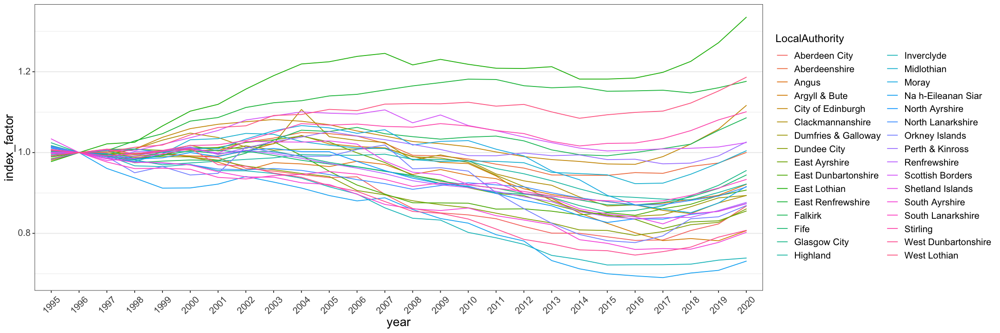

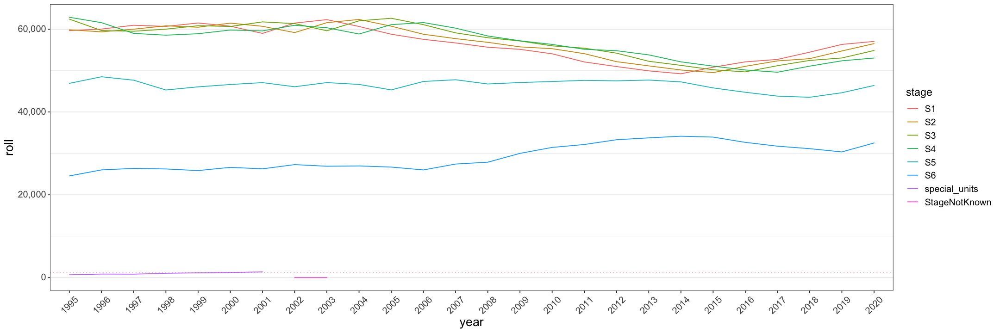

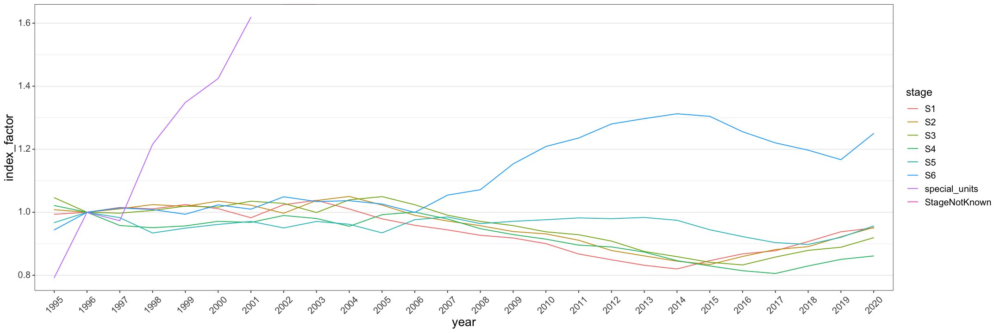

In [181]:
summary_lines <- index_factors_by_local_authority_pupils %>%
    summarise(
        median = median(roll, na.rm = TRUE),
        mean = mean(roll, na.rm = TRUE),
        min = min(roll, na.rm = TRUE),
        max = max(roll, na.rm = TRUE),
        median_base_year_census = median(base_year_census),
        mean_base_year_census = mean(base_year_census)
    )
summary_lines


options(repr.plot.width = 18, repr.plot.height = 6)

tmp_df <- index_factors_by_local_authority_pupils %>%

    group_by(LocalAuthority, year) %>%
        summarise(median_roll = median(roll, na.rm = TRUE),
                  median_base_year_census = median(base_year_census, na.rm = TRUE),
                  average_roll = mean(roll, na.rm = TRUE),
                  mean_base_year_census = mean(base_year_census, na.rm = TRUE),
                  roll = sum(roll, na.rm = TRUE),
                  base_year_census = sum(base_year_census, na.rm = TRUE)) %>%
        mutate(index_factor = roll / base_year_census,
               median_index_factor = median_roll / median_base_year_census)


tmp_df %>%

    ggplot(aes(x = year, y = roll, group = LocalAuthority, colour = LocalAuthority)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        expand_limits(y = 0) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))

tmp_df %>%

    ggplot(aes(x = year, y = index_factor, group = LocalAuthority, colour = LocalAuthority)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


tmp_df <- index_factors_by_local_authority_pupils %>%

    group_by(stage, year) %>%
        summarise(median_roll = median(roll, na.rm = TRUE),
                  median_base_year_census = median(base_year_census, na.rm = TRUE),
                  average_roll = mean(roll, na.rm = TRUE),
                  mean_base_year_census = mean(base_year_census, na.rm = TRUE),
                  roll = sum(roll, na.rm = TRUE),
                  base_year_census = sum(base_year_census, na.rm = TRUE)) %>%
        mutate(index_factor = roll / base_year_census,
               median_index_factor = median_roll / median_base_year_census)


tmp_df %>%

    ggplot(aes(x = year, y = roll, group = stage, colour = stage)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        expand_limits(y = 0) + 
        
        scale_y_continuous(labels = scales::comma) + #stop auto-conversion to scientific mode
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))

tmp_df %>%

    ggplot(aes(x = year, y = index_factor, group = stage, colour = stage)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


rm(tmp_df)

`summarise()` ungrouping output (override with `.groups` argument)

Warning message:
“Removed 16 rows containing non-finite values (stat_density).”
Warning message:
“Removed 16 rows containing non-finite values (stat_bin).”
Warning message:
“Removed 26 rows containing missing values (geom_hline).”


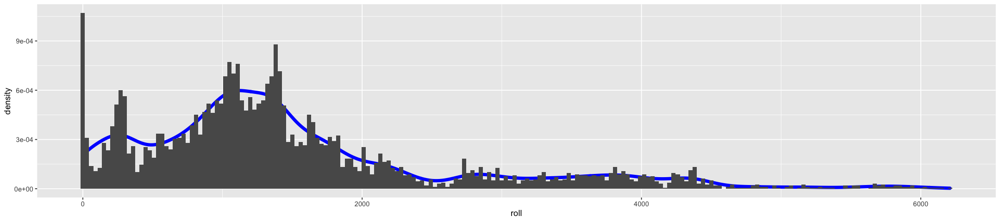

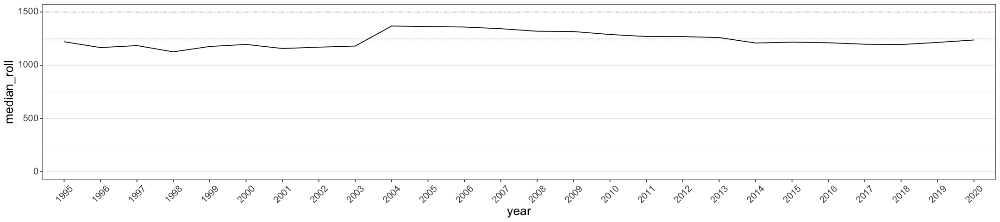

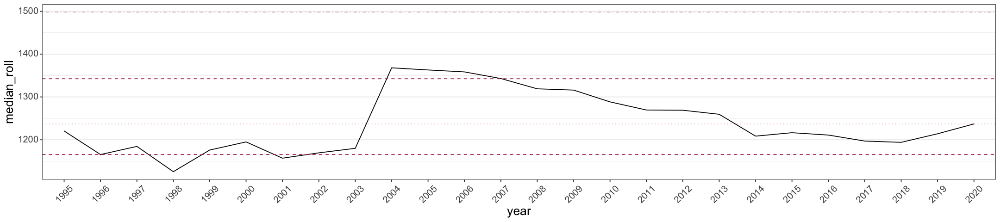

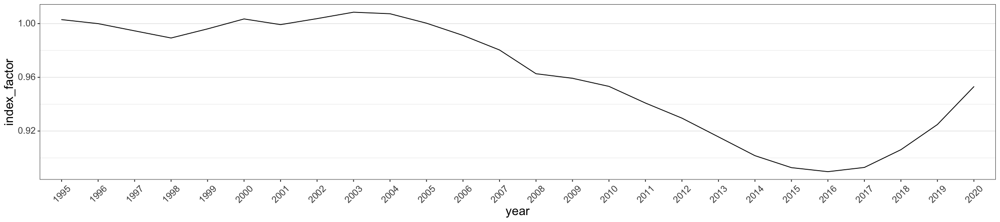

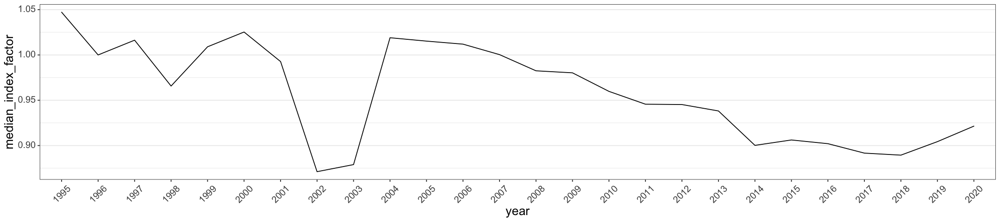

In [183]:

options(repr.plot.width = 18, repr.plot.height = 4)
tmp_df <- index_factors_by_local_authority_pupils %>%

    group_by(year) %>%
        summarise(median_roll = median(roll, na.rm = TRUE),
                  median_base_year_census = median(base_year_census, na.rm = TRUE),
                  average_roll = mean(roll, na.rm = TRUE),
                  mean_base_year_census = mean(base_year_census, na.rm = TRUE),
                  roll = sum(roll, na.rm = TRUE),
                  base_year_census = sum(base_year_census, na.rm = TRUE)) %>%
        mutate(index_factor = roll / base_year_census,
               median_index_factor = median_roll / median_base_year_census)

index_factors_by_local_authority_pupils %>%
    
    ggplot(aes(roll)) +
        geom_density(colour = "blue", size = 2) +
        geom_histogram(aes(y = stat(density)), binwidth = 30)


tmp_df %>%

    ggplot(aes(x = year, y = median_roll, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = summary_lines$median_base_year_census), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +
        expand_limits(y = 0) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


tmp_df %>%

    ggplot(aes(x = year, y = median_roll, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = median_base_year_census), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 



tmp_df %>%

    ggplot(aes(x = year, y = index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 

tmp_df %>%

    ggplot(aes(x = year, y = median_index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 


#head(tmp_df)
#write_csv(tmp_df, "base/index_factors_by_local_authority_pupils-summaries_1995_2020.csv")
rm(tmp_df)

In [118]:
head(index_factors_rolls_1996_2018)
head(index_factors_census_1966_2020)
head(index_factors_by_local_authority_pupils)

base_year
as.integer(as.character(min(index_factors_by_local_authority_pupils$year)))
as.integer(as.character(max(index_factors_by_local_authority_pupils$year)))

year,roll,base_year_roll,index_factor
<ord>,<int>,<int>,<dbl>
1996,335044,335044,1.0000000
1997,333147,335044,0.9943381
1998,331144,335044,0.9883597
1999,333074,335044,0.9941202
2000,335241,335044,1.0005880
2001,333998,335044,0.9968780


Year,secondary_schools,secondary_pupils,base_year_census,index_factor
<ord>,<int>,<int>,<int>,<dbl>
1966,NA,283592,316594,0.8957592
1967,665,288054,316594,0.9098530
1968,640,295625,316594,0.9337669
1969,616,307185,316594,0.9702805
1970,441,317027,316594,1.0013677
1971,541,327514,316594,1.0344921


LocalAuthority,year,level,cohort,roll,base_year_census,index_factor
<fct>,<ord>,<fct>,<int>,<int>,<int>,<dbl>
Aberdeen City,1995,S1,1995,2111,2160,0.9773148
Aberdeen City,1995,S2,1994,2210,2120,1.0424528
Aberdeen City,1995,S3,1993,2203,2206,0.9986401
Aberdeen City,1995,S4,1992,2129,2173,0.9797515
Aberdeen City,1995,S5,1991,1635,1554,1.0521236
Aberdeen City,1995,S6,1990,747,847,0.8819362


[1] 2015

[1] 1995

[1] 2020

In [144]:
tmp_df <- index_factors_by_local_authority_pupils %>%

    group_by(year) %>%
    summarise(roll = sum(roll, na.rm = TRUE)) %>%

    bind_cols(tmp_df %>%
              
                  filter(year == base_year) %>%
                  mutate(base_year_census = roll) %>%
                  select(base_year_census)
              ) %>%

    mutate(index_factor = roll / base_year_census) 

tmp_df

`summarise()` ungrouping output (override with `.groups` argument)



year,roll,base_year_census,index_factor
<ord>,<int>,<int>,<dbl>
1995,316957,316014,1.0029840
1996,316014,316014,1.0000000
1997,314317,316014,0.9946300
1998,312632,316014,0.9892979
1999,314780,316014,0.9960951
2000,317117,316014,1.0034904
2001,315779,316014,0.9992564
2002,316331,316014,1.0010031
2003,317839,316014,1.0057751


In [149]:
tmp_df <- bind_rows(

    tmp_df %>%
        mutate(dataset = "roll_by_la_1995-2020") %>%
        mutate_at("year", as.character) %>%
        mutate_at("year", as.integer) %>%
        rename(base_year_roll = base_year_census) %>%
        select(dataset, everything()),

    index_factors_census_1966_2020 %>%

        rename(year = Year) %>%
        mutate(dataset = "census_1996-2020") %>%
        mutate_at("year", as.character) %>%
        mutate_at("year", as.integer) %>%
        rename(base_year_roll = base_year_census) %>%
        rename(roll = secondary_pupils) %>%
        select(dataset, everything(), -secondary_schools)
    
    ) %>%
    mutate_at("year", as.ordered) 


head(tmp_df)
tail(tmp_df)


dataset,year,roll,base_year_roll,index_factor
<chr>,<ord>,<int>,<int>,<dbl>
roll_by_la_1995-2020,1995,316957,316014,1.0029840
roll_by_la_1995-2020,1996,316014,316014,1.0000000
roll_by_la_1995-2020,1997,314317,316014,0.9946300
roll_by_la_1995-2020,1998,312632,316014,0.9892979
roll_by_la_1995-2020,1999,314780,316014,0.9960951
roll_by_la_1995-2020,2000,317117,316014,1.0034904


dataset,year,roll,base_year_roll,index_factor
<chr>,<ord>,<int>,<int>,<dbl>
census_1996-2020,2015,281939,316594,0.8905380
census_1996-2020,2016,280983,316594,0.8875184
census_1996-2020,2017,281993,316594,0.8907086
census_1996-2020,2018,286152,316594,0.9038453
census_1996-2020,2019,292063,316594,0.9225159
census_1996-2020,2020,300954,316594,0.9505992


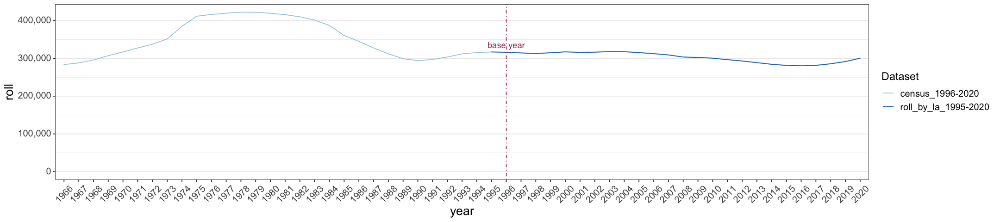

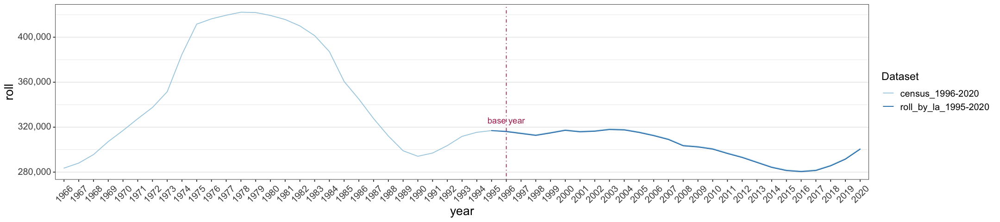

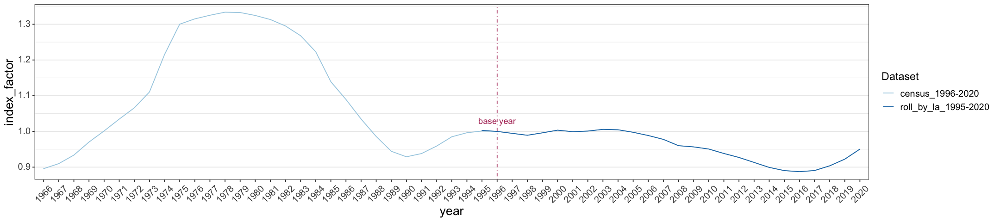

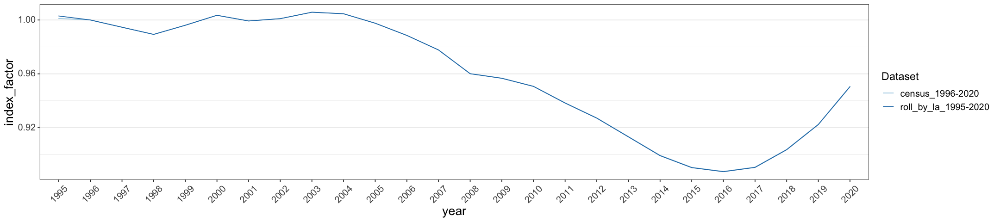

In [170]:
options(repr.plot.width = 18, repr.plot.height = 4)

tmp_df %>%

    ggplot(aes(x = year, y = roll, , group = dataset, colour = dataset)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        expand_limits(y = 0) + 

        geom_vline(aes(xintercept = as.character(base_year)), colour = "maroon", alpha = 0.95, linetype = "dotdash") +
        annotate(geom = "text", 
                 x = as.character(base_year), 
                 y = as.numeric(tmp_df[which(tmp_df$year == base_year), c("roll")][1, ]) + 20000, 
                 label = "base year",  
                 colour = "maroon") +

        scale_y_continuous(labels = scales::comma) + #stop auto-conversion to scientific mode
        scale_colour_brewer(name = "Dataset", palette = "Paired") + #, direction = -1) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 

tmp_df %>%

    ggplot(aes(x = year, y = roll, , group = dataset, colour = dataset)) +  
        geom_line(lineend = 'round', linejoin = 'round') +

        geom_vline(aes(xintercept = as.character(base_year)), colour = "maroon", alpha = 0.95, linetype = "dotdash") +
        annotate(geom = "text", 
                 x = as.character(base_year), 
                 y = as.numeric(tmp_df[which(tmp_df$year == base_year), c("roll")][1, ]) + 10000, 
                 label = "base year",  
                 colour = "maroon") +

        scale_y_continuous(labels = scales::comma) + #stop auto-conversion to scientific mode
        scale_colour_brewer(name = "Dataset", palette = "Paired") + #, direction = -1) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 


tmp_df %>%

    ggplot(aes(x = year, y = index_factor, group = dataset, colour = dataset)) +  
        geom_line(lineend = 'round', linejoin = 'round') +

        geom_vline(aes(xintercept = as.character(base_year)), colour = "maroon", alpha = 0.95, linetype = "dotdash") +
        annotate(geom = "text", 
                 x = as.character(base_year), 
                 y = as.numeric(tmp_df[which(tmp_df$year == base_year), c("index_factor")][1, ]) + 0.03, 
                 label = "base year",  
                 colour = "maroon") +

        scale_colour_brewer(name = "Dataset", palette = "Paired") + #, direction = -1) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 

tmp_df %>%
    filter((year >= as.integer(as.character(min(index_factors_by_local_authority_pupils$year)))) & 
           (year <= as.integer(as.character(max(index_factors_by_local_authority_pupils$year))))) %>%

    ggplot(aes(x = year, y = index_factor, group = dataset, colour = dataset)) +  
        geom_line(lineend = 'round', linejoin = 'round') +

        scale_colour_brewer(name = "Dataset", palette = "Paired") +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 


* confirms breakdown by LA correctly done - data from same collection

#### Techers ...

In [34]:
historical_census_teachers_by_la_1995_2020 <- read_csv("sta_it_402/data/demographic_data/teacher_la_census_1995-2020.csv", trim_ws = T) %>% #, skip_empty_rows = T) # NOT skipping empty rows... :(
                    filter(rowSums(is.na(.)) != ncol(.))

glimpse(historical_census_teachers_by_la_1995_2020)
head(historical_census_teachers_by_la_1995_2020)



── Column specification ───────────────────────────────────────────────────────────────────
cols(
  .default = col_number(),
  LocalAuthority = col_character()
)
ℹ Use `spec()` for the full column specifications.




Rows: 32
Columns: 27
$ LocalAuthority <chr> "Aberdeen City", "Aberdeenshire", "Angus", "Argyll & B…
$ `1995`         <dbl> 855, 1100, 565, 456, 1430, 221, 799, 750, 613, 628, 35…
$ `1996`         <dbl> 861, 1102, 562, 456, 1399, 219, 755, 733, 591, 628, 35…
$ `1997`         <dbl> 861, 1110, 568, 446, 1388, 220, 792, 687, 586, 615, 35…
$ `1998`         <dbl> 868, 1136, 573, 444, 1428, 228, 817, 714, 582, 619, 36…
$ `1999`         <dbl> 875, 1168, 576, 441, 1498, 233, 808, 728, 587, 629, 39…
$ `2000`         <dbl> 893, 1137, 577, 448, 1554, 237, 784, 739, 591, 627, 40…
$ `2001`         <dbl> 882, 1157, 572, 448, 1543, 238, 792, 723, 593, 630, 41…
$ `2002`         <dbl> 883, 1247, 579, 455, 1600, 236, 804, 768, 605, 640, 44…
$ `2003`         <dbl> 896, 1245, 576, 442, 1551, 224, 793, 727, 620, 648, 44…
$ `2004`         <dbl> 879, 1243, 559, 450, 1559, 224, 788, 751, 610, 659, 44…
$ `2005`         <dbl> 871, 1286, 597, 478, 1602, 235, 808, 720, 624, 691, 47…
$ `2006`         <dbl> 906, 129

LocalAuthority,1995,1996,1997,1998,1999,2000,2001,2002,2003,⋯,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Aberdeen City,855,861,861,868,875,893,882,883,896,⋯,744,741,740,745,735,712,714,716,722,751
Aberdeenshire,1100,1102,1110,1136,1168,1137,1157,1247,1245,⋯,1258,1222,1209,1205,1217,1192,1199,1206,1212,1234
Angus,565,562,568,573,576,577,572,579,576,⋯,581,570,570,555,548,545,547,555,560,575
Argyll & Bute,456,456,446,444,441,448,448,455,442,⋯,432,439,434,438,425,423,401,419,402,406
City of Edinburgh,1430,1399,1388,1428,1498,1554,1543,1600,1551,⋯,1487,1488,1483,1429,1418,1408,1437,1462,1535,1594
Clackmannanshire,221,219,220,228,233,237,238,236,224,⋯,221,221,228,229,214,226,218,211,221,233


In [35]:
historical_census_teachers_by_la_1995_2020 <- historical_census_teachers_by_la_1995_2020 %>%

    mutate_at(vars(LocalAuthority), as.factor) %>%
    
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), as.character) %>%
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), parse_number) %>%
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), as.integer) %>%

    pivot_longer(matches(regex("\\b\\d{4}\\b")), names_to = "year", values_to = "teacher_count") %>% 
    mutate_at(c("year"), as.ordered)

glimpse(historical_census_teachers_by_la_1995_2020)

Rows: 832
Columns: 3
$ LocalAuthority <fct> Aberdeen City, Aberdeen City, Aberdeen City, Aberdeen …
$ year           <ord> 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, …
$ teacher_count  <int> 855, 861, 861, 868, 875, 893, 882, 883, 896, 879, 871,…


In [36]:
index_factors_by_local_authority_teachers <- historical_census_teachers_by_la_1995_2020 %>%

    left_join(historical_census_teachers_by_la_1995_2020 %>%
              
                  filter(year == base_year) %>%
                  mutate(base_year_census = teacher_count) %>%
                  select(LocalAuthority, base_year_census)
              ) %>%

    mutate(index_factor = teacher_count / base_year_census)
    
index_factors_by_local_authority_teachers[c(1:6, 27:34), ]


Joining, by = "LocalAuthority"



LocalAuthority,year,teacher_count,base_year_census,index_factor
<fct>,<ord>,<int>,<int>,<dbl>
Aberdeen City,1995,855,861,0.9930314
Aberdeen City,1996,861,861,1.0000000
Aberdeen City,1997,861,861,1.0000000
Aberdeen City,1998,868,861,1.0081301
Aberdeen City,1999,875,861,1.0162602
Aberdeen City,2000,893,861,1.0371661
Aberdeenshire,1995,1100,1102,0.9981851
Aberdeenshire,1996,1102,1102,1.0000000
Aberdeenshire,1997,1110,1102,1.0072595


median,mean,min,max,median_base_year_census,mean_base_year_census
<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
617.5,762.274,125,2431,600,756.8125


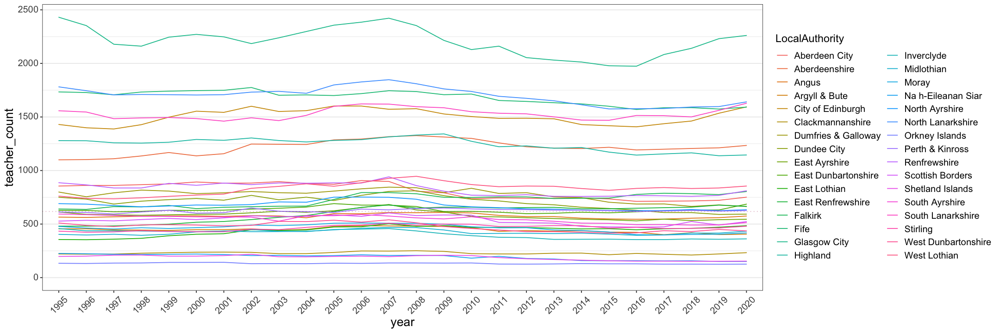

`summarise()` ungrouping output (override with `.groups` argument)



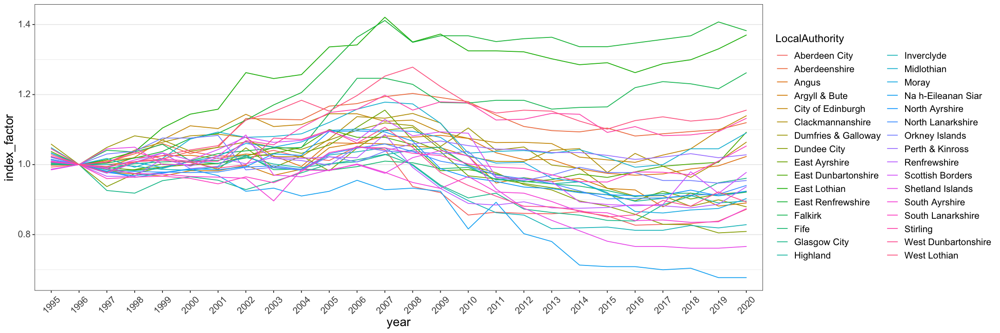

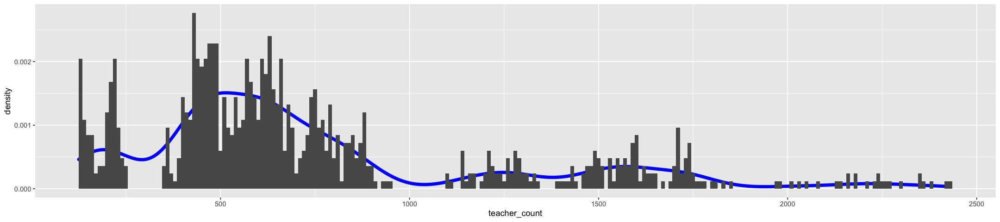

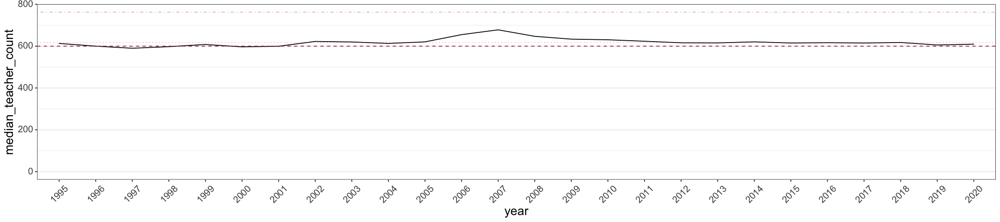

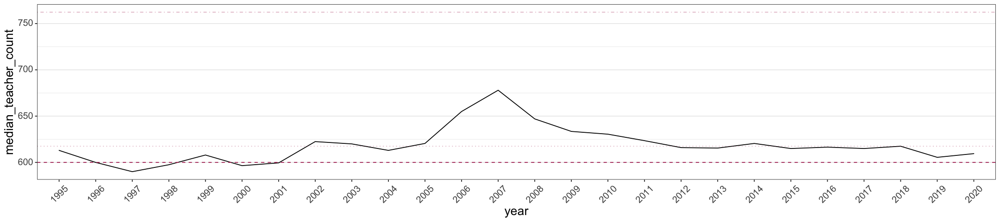

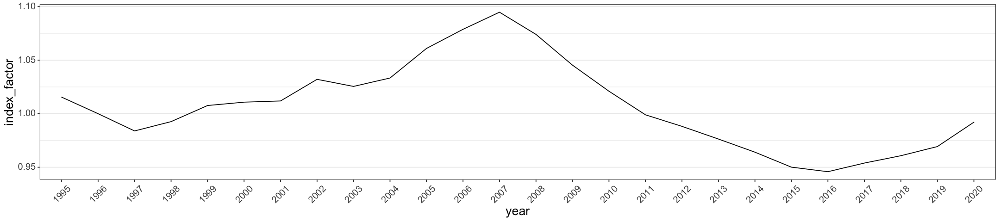

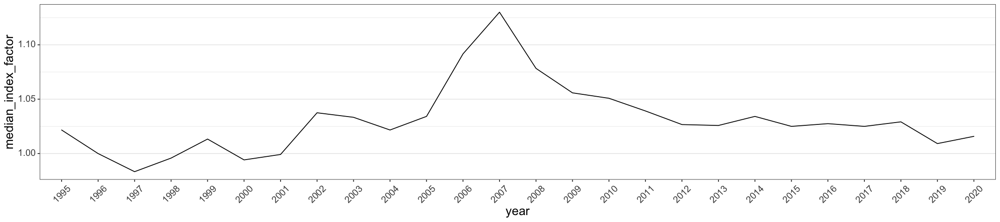

In [37]:
summary_lines <- index_factors_by_local_authority_teachers %>%
    summarise(
        median = median(teacher_count),
        mean = mean(teacher_count),
        min = min(teacher_count),
        max = max(teacher_count),
        median_base_year_census = median(base_year_census),
        mean_base_year_census = mean(base_year_census)
    )
summary_lines



options(repr.plot.width = 18, repr.plot.height = 6)

index_factors_by_local_authority_teachers %>%

    ggplot(aes(x = year, y = teacher_count, group = LocalAuthority, colour = LocalAuthority)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        expand_limits(y = 0) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))

index_factors_by_local_authority_teachers %>%

    ggplot(aes(x = year, y = index_factor, group = LocalAuthority, colour = LocalAuthority)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        #geom_hline(aes(yintercept = summary_lines$median_base_year_census), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))



options(repr.plot.width = 18, repr.plot.height = 4)
tmp_df <- index_factors_by_local_authority_teachers %>%

    group_by(year) %>%
        summarise(median_teacher_count = median(teacher_count, na.rm = TRUE),
                  median_base_year_census = median(base_year_census, na.rm = TRUE),
                  average_teacher_count = mean(teacher_count, na.rm = TRUE),
                  mean_base_year_census = mean(base_year_census, na.rm = TRUE),
                  teacher_count = sum(teacher_count, na.rm = TRUE),
                  base_year_census = sum(base_year_census, na.rm = TRUE)) %>%
        mutate(index_factor = teacher_count / base_year_census,
               median_index_factor = median_teacher_count / median_base_year_census)

index_factors_by_local_authority_teachers %>%
    
    ggplot(aes(teacher_count)) +
        geom_density(colour = "blue", size = 2) +
        geom_histogram(aes(y = stat(density)), binwidth = 10)


tmp_df %>%

    ggplot(aes(x = year, y = median_teacher_count, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = summary_lines$median_base_year_census), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +
        expand_limits(y = 0) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


tmp_df %>%

    ggplot(aes(x = year, y = median_teacher_count, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = median_base_year_census), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +

        #scale_y_continuous(labels = scales::comma) + #stop auto-conversion to scientific mode
        #scale_x_continuous(breaks = seq(min(index_factors_by_local_authority_teachers$year), max(index_factors_by_local_authority_teachers$year), 1)) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 



tmp_df %>%

    ggplot(aes(x = year, y = index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 

tmp_df %>%

    ggplot(aes(x = year, y = median_index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 


#head(tmp_df)
#write_csv(tmp_df, "base/index_factors_by_local_authority_teachers-summaries_1995_2020.csv")
rm(tmp_df)

#### Techers ... Main Subject

In [38]:
historical_census_teachers_main_subject_2008_2020 <- read_csv("sta_it_402/data/demographic_data/teachers_main_subject_2008-2020.csv", trim_ws = T) %>% #, skip_empty_rows = T) # NOT skipping empty rows... :(
                                                            filter(rowSums(is.na(.)) != ncol(.))

glimpse(historical_census_teachers_main_subject_2008_2020)
head(historical_census_teachers_main_subject_2008_2020)



── Column specification ───────────────────────────────────────────────────────────────────
cols(
  Subject = col_character(),
  `2008` = col_number(),
  `2009` = col_number(),
  `2010` = col_number(),
  `2011` = col_number(),
  `2012` = col_number(),
  `2013` = col_number(),
  `2014` = col_number(),
  `2015` = col_number(),
  `2016` = col_number(),
  `2017` = col_number(),
  `2018` = col_number(),
  `2019` = col_number(),
  `2020` = col_number()
)




Rows: 38
Columns: 14
$ Subject <chr> "English", "French", "German", "Spanish", "Gaelic", "Italian"…
$ `2008`  <dbl> 2992, 1070, 180, 64, 57, 12, 39, 8, 290, 27, 2787, 1177, 989,…
$ `2009`  <dbl> 2915, 1004, 175, 66, 57, 9, 42, 7, 297, 24, 2718, 1177, 963, …
$ `2010`  <dbl> 2794, 952, 166, 78, 59, 10, 39, 7, 280, 21, 2644, 1162, 936, …
$ `2011`  <dbl> 2678, 900, 153, 71, 60, 11, 32, 8, 286, 13, 2533, 1157, 928, …
$ `2012`  <dbl> 2636, 860, 152, 71, 61, 10, 10, 7, 299, 12, 2504, 1169, 935, …
$ `2013`  <dbl> 2590, 826, 136, 93, 60, 8, 9, 6, 276, 11, 2441, 1190, 935, 11…
$ `2014`  <dbl> 2537, 780, 128, 96, 61, 8, 7, 6, 300, 9, 2403, 1179, 937, 129…
$ `2015`  <dbl> 2509, 744, 118, 96, 59, 9, 5, 5, 313, 10, 2350, 1165, 932, 12…
$ `2016`  <dbl> 2466, 716, 106, 95, 60, 7, 4, 4, 339, 8, 2331, 1183, 942, 131…
$ `2017`  <dbl> 2483, 722, 100, 107, 57, 6, 5, 5, 354, 7, 2361, 1153, 982, 13…
$ `2018`  <dbl> 2473, 688, 90, 119, 58, 9, 6, 5, 378, 7, 2364, 1213, 948, 144…
$ `2019`  <dbl> 2491, 648, 80, 

Subject,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
English,2992,2915,2794,2678,2636,2590,2537,2509,2466,2483,2473,2491,2575
French,1070,1004,952,900,860,826,780,744,716,722,688,648,655
German,180,175,166,153,152,136,128,118,106,100,90,80,88
Spanish,64,66,78,71,71,93,96,96,95,107,119,127,132
Gaelic,57,57,59,60,61,60,61,59,60,57,58,58,61
Italian,12,9,10,11,10,8,8,9,7,6,9,11,10


In [39]:
historical_census_teachers_main_subject_2008_2020 <- historical_census_teachers_main_subject_2008_2020 %>%

    mutate_at(vars(Subject), as.factor) %>%
    
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), as.character) %>%
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), parse_number) %>%
    mutate_at(vars(matches(regex("\\b\\d{4}\\b"))), as.integer) %>%

    pivot_longer(matches(regex("\\b\\d{4}\\b")), names_to = "year", values_to = "teacher_count") %>% 
    mutate_at(c("year"), as.ordered)

glimpse(historical_census_teachers_main_subject_2008_2020)
head(historical_census_teachers_main_subject_2008_2020)

Rows: 494
Columns: 3
$ Subject       <fct> English, English, English, English, English, English, E…
$ year          <ord> 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2…
$ teacher_count <int> 2992, 2915, 2794, 2678, 2636, 2590, 2537, 2509, 2466, 2…


Subject,year,teacher_count
<fct>,<ord>,<int>
English,2008,2992
English,2009,2915
English,2010,2794
English,2011,2678
English,2012,2636
English,2013,2590


In [40]:
# data here starts ta 2008 - set base year to 2018 so as to allow retrogressive re-indexing for all other data
# also caters for demographics data extracted from SQA qualifications files

base_year
base_year = 2015 # need also for for SQA candidate demographics

[1] 1996

In [41]:
index_factors_by_main_subject_teachers_2008_2020 <- historical_census_teachers_main_subject_2008_2020 %>%

    left_join(historical_census_teachers_main_subject_2008_2020 %>%
              
                  filter(year == base_year) %>%
                  mutate(base_year_census = teacher_count) %>%
                  select(Subject, base_year_census)
              ) %>%

    mutate(index_factor = teacher_count / base_year_census)
    
dim(index_factors_by_main_subject_teachers_2008_2020)
index_factors_by_main_subject_teachers_2008_2020[c(18:26, 308:324), ]



Joining, by = "Subject"



[1] 494   5

Subject,year,teacher_count,base_year_census,index_factor
<fct>,<ord>,<int>,<int>,<dbl>
French,2012,860,744,1.1559140
French,2013,826,744,1.1102151
French,2014,780,744,1.0483871
French,2015,744,744,1.0000000
French,2016,716,744,0.9623656
French,2017,722,744,0.9704301
French,2018,688,744,0.9247312
French,2019,648,744,0.8709677
French,2020,655,744,0.8803763


median,mean,min,max,median_base_year_census,mean_base_year_census
<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
435.5,590.7611,1,2992,450,568.1842


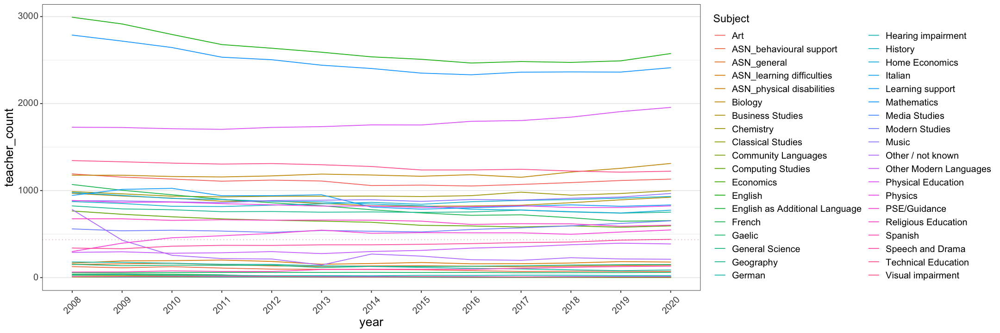

`summarise()` ungrouping output (override with `.groups` argument)



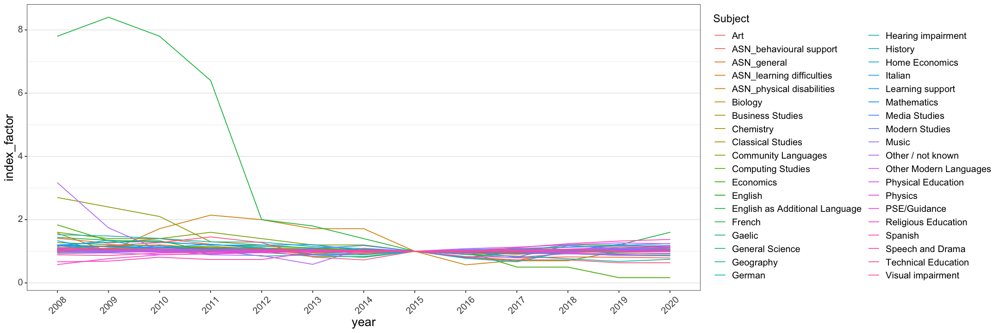

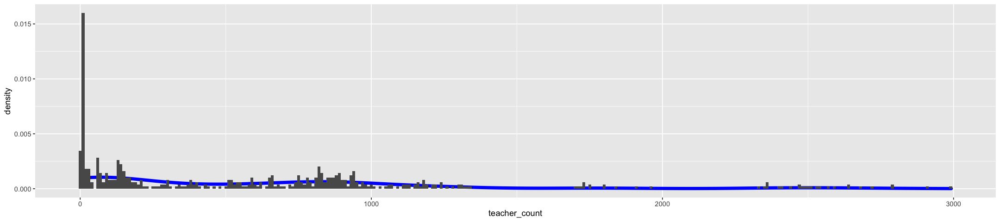

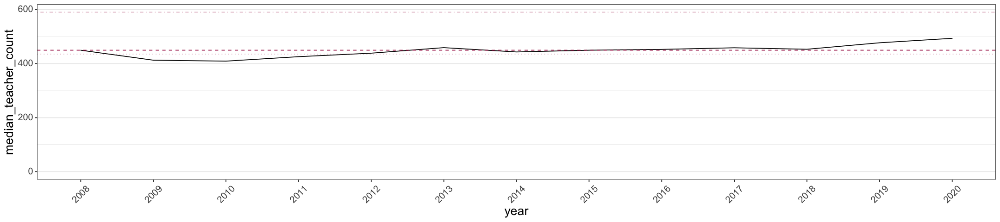

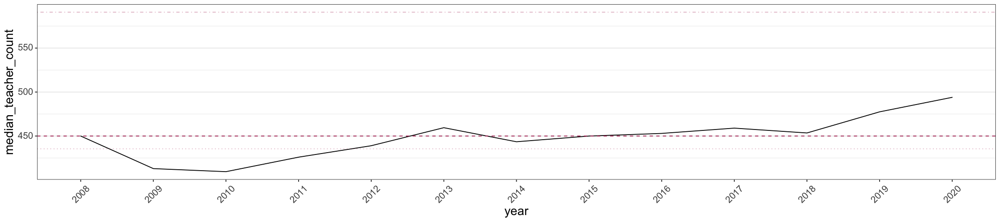

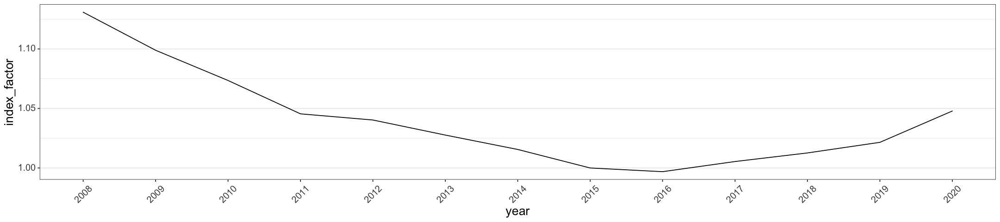

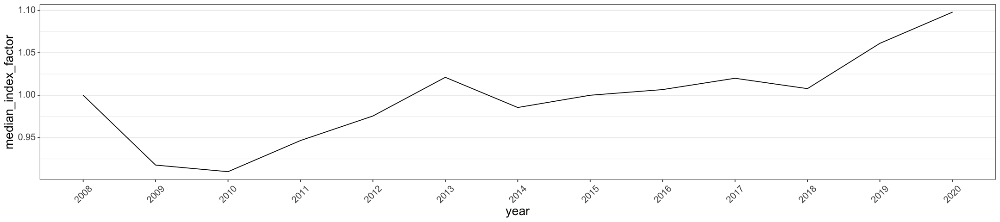

In [42]:
summary_lines <- index_factors_by_main_subject_teachers_2008_2020 %>%
    summarise(
        median = median(teacher_count),
        mean = mean(teacher_count),
        min = min(teacher_count),
        max = max(teacher_count),
        median_base_year_census = median(base_year_census),
        mean_base_year_census = mean(base_year_census)
    )
summary_lines



options(repr.plot.width = 18, repr.plot.height = 6)

index_factors_by_main_subject_teachers_2008_2020 %>%

    ggplot(aes(x = year, y = teacher_count, group = Subject, colour = Subject)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        expand_limits(y = 0) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))

index_factors_by_main_subject_teachers_2008_2020 %>%

    ggplot(aes(x = year, y = index_factor, group = Subject, colour = Subject)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        #geom_hline(aes(yintercept = summary_lines$median_base_year_census), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))



options(repr.plot.width = 18, repr.plot.height = 4)
tmp_df <- index_factors_by_main_subject_teachers_2008_2020 %>%

    group_by(year) %>%
        summarise(median_teacher_count = median(teacher_count, na.rm = TRUE),
                  median_base_year_census = median(base_year_census, na.rm = TRUE),
                  average_teacher_count = mean(teacher_count, na.rm = TRUE),
                  mean_base_year_census = mean(base_year_census, na.rm = TRUE),
                  teacher_count = sum(teacher_count, na.rm = TRUE),
                  base_year_census = sum(base_year_census, na.rm = TRUE)) %>%
        mutate(index_factor = teacher_count / base_year_census,
               median_index_factor = median_teacher_count / median_base_year_census)

index_factors_by_main_subject_teachers_2008_2020 %>%
    
    ggplot(aes(teacher_count)) +
        geom_density(colour = "blue", size = 2) +
        geom_histogram(aes(y = stat(density)), binwidth = 10)


tmp_df %>%

    ggplot(aes(x = year, y = median_teacher_count, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = summary_lines$median_base_year_census), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +
        expand_limits(y = 0) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


tmp_df %>%

    ggplot(aes(x = year, y = median_teacher_count, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = median_base_year_census), colour = "maroon", linetype = "dashed") +
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        geom_hline(aes(yintercept = summary_lines$mean), colour = "maroon", alpha = 0.35, linetype = "dotdash") +

        #scale_y_continuous(labels = scales::comma) + #stop auto-conversion to scientific mode
        #scale_x_continuous(breaks = seq(min(index_factors_by_main_subject_teachers_2008_2020$year), max(index_factors_by_main_subject_teachers_2008_2020$year), 1)) + 
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 



tmp_df %>%

    ggplot(aes(x = year, y = index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 

tmp_df %>%

    ggplot(aes(x = year, y = median_index_factor, group = 1)) +  
        geom_line(lineend = 'round', linejoin = 'round') +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) 


#head(tmp_df)
#write_csv(tmp_df, "base/index_factors_by_main_subject_teachers-summaries_2008_2020.csv")
rm(tmp_df)

In [184]:

#write_csv(index_factors_by_local_authority, "base/index_factors_by_local_authority_school_rolls_1996_2018.csv")
#write_csv(index_factors_rolls_1996_2018, "base/index_factors_school_rolls_1996_2018.csv")
#write_csv(index_factors_census_1966_2020, "base/index_factors_census_pupils_1966_2020.csv")
#write_csv(index_factors_by_local_authority_teachers, "base/index_factors_by_local_authority_teachers_1995_2020.csv")
#write_csv(index_factors_by_local_authority_pupils, "base/index_factors_by_local_authority_pupils_1995_2020.csv")
#write_csv(index_factors_by_main_subject_teachers_2008_2020, "base/index_factors_by_main_subject_teachers_2008_2020.csv")
#write_csv(index_factors_sqa_candidate_census_1986_2020, "base/index_factors_sqa_candidate_census_1986_2020.csv")


<p><br />&nbsp;</p>

### Population &ndash; Candidate Counts - from SQA qualification data by year

#### Notes

* data contained in (some) qualifcations datasets. Inconsistent to a degree.

* from 2014	At Higher levels, all passes === sum of grades A to C; however D appears to be considered a pass in at least the 2020 data

<p>&nbsp;</p>

In [44]:

demographics_candidates <- read_csv("sta_it_402/data/demographic_data/total_candidates.csv", trim_ws = T) %>% #, skip_empty_rows = T) # NOT skipping empty rows... :(
                                filter(rowSums(is.na(.)) != ncol(.)) %>% # caters for skip rows argument not working
                                suppressMessages()

glimpse(demographics_candidates)
head(demographics_candidates)
#spec(demographics_candidates)

Rows: 35
Columns: 86
$ year                          <dbl> 1986, 1987, 1988, 1989, 1990, 1991, 199…
$ `all-Higher`                  <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `male-Higher`                 <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `female-Higher`               <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NotKnown-Higher`             <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NA-Higher`                   <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `all-NewHigher`               <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `male-NewHigher`              <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `female-NewHigher`            <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NotKnown-NewHigher`          <lgl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NA-NewHigher`                <lgl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `all-AdvancedHigher`          <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `male-AdvancedHigher`        

year,all-Higher,male-Higher,female-Higher,NotKnown-Higher,NA-Higher,all-NewHigher,male-NewHigher,female-NewHigher,NotKnown-NewHigher,⋯,all-Intermediate1,male-Intermediate1,female-Intermediate1,NotKnown-Intermediate1,NA-Intermediate1,all-Intermediate2,male-Intermediate2,female-Intermediate2,NotKnown-Intermediate2,NA-Intermediate2
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,⋯,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>
1986,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1987,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1988,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1989,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1990,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1991,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [45]:
demographics_candidates <- demographics_candidates %>%

    mutate_at(c("year"), as.factor) %>%
    rename_with(~ gsub("NA-", "NotApplicable-", .x, fixed = TRUE)) %>%

    mutate_at(vars(!matches("\\byear\\b")), as.character) %>%
    mutate_at(vars(!matches("\\byear\\b")), parse_number) %>%
    mutate_at(vars(!matches("\\byear\\b")), as.integer) %>%

    suppressWarnings()

head(demographics_candidates)

year,all-Higher,male-Higher,female-Higher,NotKnown-Higher,NotApplicable-Higher,all-NewHigher,male-NewHigher,female-NewHigher,NotKnown-NewHigher,⋯,all-Intermediate1,male-Intermediate1,female-Intermediate1,NotKnown-Intermediate1,NotApplicable-Intermediate1,all-Intermediate2,male-Intermediate2,female-Intermediate2,NotKnown-Intermediate2,NotApplicable-Intermediate2
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1986,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1987,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1988,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1989,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1990,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1991,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [46]:
demographics_total_subject_entries <- read_csv("sta_it_402/data/demographic_data/total_subject_entries.csv", trim_ws = T) %>% 
                    filter(rowSums(is.na(.)) != ncol(.))
glimpse(demographics_total_subject_entries)


demographics_total_passes <- read_csv("sta_it_402/data/demographic_data/total_passes.csv", trim_ws = T) %>% 
                    filter(rowSums(is.na(.)) != ncol(.))
glimpse(demographics_total_passes)



── Column specification ───────────────────────────────────────────────────────────────────
cols(
  .default = col_logical(),
  year = col_double(),
  `all-Higher` = col_number(),
  `male-Higher` = col_number(),
  `female-Higher` = col_number(),
  `NotKnown-Higher` = col_double(),
  `NA-Higher` = col_double(),
  `all-NewHigher` = col_number(),
  `male-NewHigher` = col_number(),
  `female-NewHigher` = col_number(),
  `all-AdvancedHigher` = col_number(),
  `male-AdvancedHigher` = col_number(),
  `female-AdvancedHigher` = col_number(),
  `NotKnown-AdvancedHigher` = col_double(),
  `NA-AdvancedHigher` = col_double(),
  `all-StandardGrade` = col_number(),
  `male-StandardGrade` = col_number(),
  `female-StandardGrade` = col_number(),
  `all-CSYS` = col_number(),
  `male-CSYS` = col_number(),
  `female-CSYS` = col_number()
  # ... with 24 more columns
)
ℹ Use `spec()` for the full column specifications.




Rows: 35
Columns: 86
$ year                          <dbl> 1986, 1987, 1988, 1989, 1990, 1991, 199…
$ `all-Higher`                  <dbl> 166403, 165936, 169818, 166845, 158191,…
$ `male-Higher`                 <dbl> 78372, 77016, 78651, 77267, 74154, 7076…
$ `female-Higher`               <dbl> 88031, 88920, 91167, 89578, 84037, 8503…
$ `NotKnown-Higher`             <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NA-Higher`                   <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `all-NewHigher`               <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `male-NewHigher`              <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `female-NewHigher`            <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NotKnown-NewHigher`          <lgl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NA-NewHigher`                <lgl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `all-AdvancedHigher`          <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `male-AdvancedHigher`        


── Column specification ───────────────────────────────────────────────────────────────────
cols(
  .default = col_logical(),
  year = col_double(),
  `all-Higher` = col_number(),
  `male-Higher` = col_number(),
  `female-Higher` = col_number(),
  `NotKnown-Higher` = col_double(),
  `NA-Higher` = col_double(),
  `all-NewHigher` = col_number(),
  `male-NewHigher` = col_number(),
  `female-NewHigher` = col_number(),
  `all-AdvancedHigher` = col_number(),
  `male-AdvancedHigher` = col_number(),
  `female-AdvancedHigher` = col_number(),
  `NotKnown-AdvancedHigher` = col_double(),
  `NA-AdvancedHigher` = col_character(),
  `all-StandardGrade` = col_number(),
  `male-StandardGrade` = col_number(),
  `female-StandardGrade` = col_number(),
  `all-CSYS` = col_number(),
  `male-CSYS` = col_number(),
  `female-CSYS` = col_number()
  # ... with 23 more columns
)
ℹ Use `spec()` for the full column specifications.




Rows: 35
Columns: 86
$ year                          <dbl> 1986, 1987, 1988, 1989, 1990, 1991, 199…
$ `all-Higher`                  <dbl> 110390, 110463, 113619, 113538, 106445,…
$ `male-Higher`                 <dbl> 51655, 51426, 52105, 51752, 49373, 4752…
$ `female-Higher`               <dbl> 58735, 59037, 61514, 61786, 57072, 5902…
$ `NotKnown-Higher`             <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NA-Higher`                   <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `all-NewHigher`               <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `male-NewHigher`              <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `female-NewHigher`            <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NotKnown-NewHigher`          <lgl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `NA-NewHigher`                <lgl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `all-AdvancedHigher`          <dbl> NA, NA, NA, NA, NA, NA, NA, NA, NA, NA,…
$ `male-AdvancedHigher`        

In [47]:
demographics_total_subject_entries <- demographics_total_subject_entries %>%

    mutate_at(c("year"), as.factor) %>%
    rename_with(~ gsub("NA-", "NotApplicable-", .x, fixed = TRUE)) %>%
    mutate_at(vars(!matches("\\byear\\b")), as.character) %>%
    mutate_at(vars(!matches("\\byear\\b")), parse_number) %>%
    mutate_at(vars(!matches("\\byear\\b")), as.integer)

#head(demographics_total_subject_entries)
demographics_total_subject_entries %>%
    select(year, (contains("Higher") & !contains("National"))) %>%
    head

Warning message:
“Problem with `mutate()` input `NotApplicable-National4`.
ℹ 1 parsing failure.
row col expected actual
 34  -- a number      -

ℹ Input `NotApplicable-National4` is `(function (x, na = c("", "NA"), locale = default_locale(), trim_ws = TRUE) ...`.”
Warning message:
“1 parsing failure.
row col expected actual
 34  -- a number      -
”
Warning message:
“Problem with `mutate()` input `NotApplicable-National3`.
ℹ 1 parsing failure.
row col expected actual
 34  -- a number      -

ℹ Input `NotApplicable-National3` is `(function (x, na = c("", "NA"), locale = default_locale(), trim_ws = TRUE) ...`.”
Warning message:
“1 parsing failure.
row col expected actual
 34  -- a number      -
”


year,all-Higher,male-Higher,female-Higher,NotKnown-Higher,NotApplicable-Higher,all-NewHigher,male-NewHigher,female-NewHigher,NotKnown-NewHigher,NotApplicable-NewHigher,all-AdvancedHigher,male-AdvancedHigher,female-AdvancedHigher,NotKnown-AdvancedHigher,NotApplicable-AdvancedHigher
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1986,166403,78372,88031,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1987,165936,77016,88920,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1988,169818,78651,91167,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1989,166845,77267,89578,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1990,158191,74154,84037,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1991,155794,70760,85034,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [48]:
demographics_total_passes <- demographics_total_passes %>%

    mutate_at(c("year"), as.factor) %>%
    rename_with(~ gsub("NA-", "NotApplicable-", .x, fixed = TRUE)) %>%
    mutate_at(vars(!matches("\\byear\\b")), as.character) %>%
    mutate_at(vars(!matches("\\byear\\b")), parse_number) %>%
    mutate_at(vars(!matches("\\byear\\b")), as.integer) %>%

    suppressWarnings()

#head(demographics_total_passes)
demographics_total_passes %>%
    #select(year, ends_with("-Higher")) 3%>%
    select(year, (contains("Higher") & !contains("National"))) #%>%
    #head

year,all-Higher,male-Higher,female-Higher,NotKnown-Higher,NotApplicable-Higher,all-NewHigher,male-NewHigher,female-NewHigher,NotKnown-NewHigher,NotApplicable-NewHigher,all-AdvancedHigher,male-AdvancedHigher,female-AdvancedHigher,NotKnown-AdvancedHigher,NotApplicable-AdvancedHigher
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1986,110390,51655,58735,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1987,110463,51426,59037,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1988,113619,52105,61514,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1989,113538,51752,61786,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1990,106445,49373,57072,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1991,106549,47528,59021,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1992,108579,49053,59526,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1993,109825,49838,59987,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
1994,110259,48916,61343,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


<p><br />&nbsp;</p>

### Run filters, focus initially on Higher variants

<p>&nbsp;</p>

In [49]:
demographics_candidates %>%

    select(year, ends_with("-Higher")) 


year,all-Higher,male-Higher,female-Higher,NotKnown-Higher,NotApplicable-Higher
<fct>,<int>,<int>,<int>,<int>,<int>
1986,NA,NA,NA,NA,NA
1987,NA,NA,NA,NA,NA
1988,NA,NA,NA,NA,NA
1989,NA,NA,NA,NA,NA
1990,NA,NA,NA,NA,NA
1991,NA,NA,NA,NA,NA
1992,NA,NA,NA,NA,NA
1993,NA,NA,NA,NA,NA
1994,NA,NA,NA,NA,NA


In [50]:

tmp_df <- demographics_candidates %>%
    select(year, (contains("Higher") & !contains("National"))) %>%

    pivot_longer(!year, names_to = "qualification", values_to = "candidate_count") %>%
    separate("qualification", c("gender", "qualification")) %>%
    mutate_at(c("gender", "qualification"), as.factor)

tmp_df %>%
    head()
tmp_df %>%
    tail(20)


year,gender,qualification,candidate_count
<fct>,<fct>,<fct>,<int>
1986,all,Higher,NA
1986,male,Higher,NA
1986,female,Higher,NA
1986,NotKnown,Higher,NA
1986,NotApplicable,Higher,NA
1986,all,NewHigher,NA


year,gender,qualification,candidate_count
<fct>,<fct>,<fct>,<int>
2019,all,AdvancedHigher,13923
2019,male,AdvancedHigher,5916
2019,female,AdvancedHigher,8006
2019,NotKnown,AdvancedHigher,1
2019,NotApplicable,AdvancedHigher,0
2020,all,Higher,NA
2020,male,Higher,NA
2020,female,Higher,NA
2020,NotKnown,Higher,NA


Warning message:
“Removed 50 row(s) containing missing values (geom_path).”
Warning message:
“Removed 62 rows containing missing values (geom_point).”


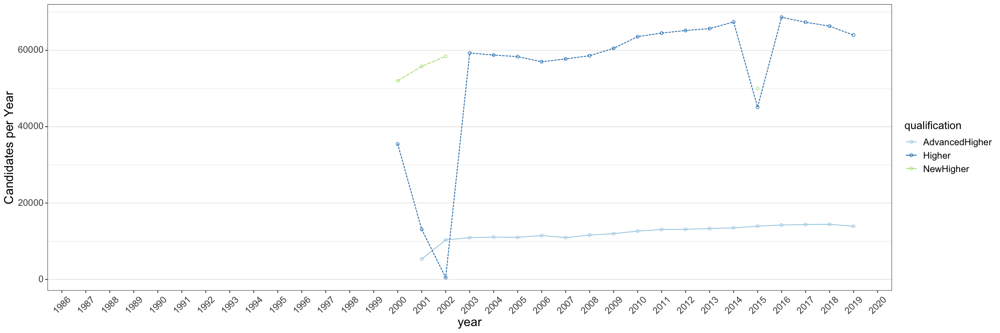

In [51]:
options(repr.plot.width = 18, repr.plot.height = 6)

tmp_df %>%
    filter(gender %in% c("all")) %>% 


    ggplot(aes(x = year, y = candidate_count, group = qualification, colour = qualification, linetype = qualification), na.rm = TRUE) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_point(aes(colour = qualification), pch = 21) +
        
        ylab("Candidates per Year") + 
        scale_linetype(guide = FALSE) +
        dressCodeTheme +
        scale_colour_brewer(palette = "Paired") +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))              
        

Warning message:
“Removed 100 row(s) containing missing values (geom_path).”
Warning message:
“Removed 100 rows containing missing values (geom_point).”
Warning message:
“Removed 176 row(s) containing missing values (geom_path).”
Warning message:
“Removed 230 rows containing missing values (geom_point).”


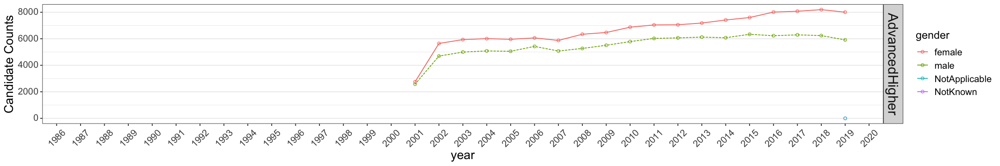

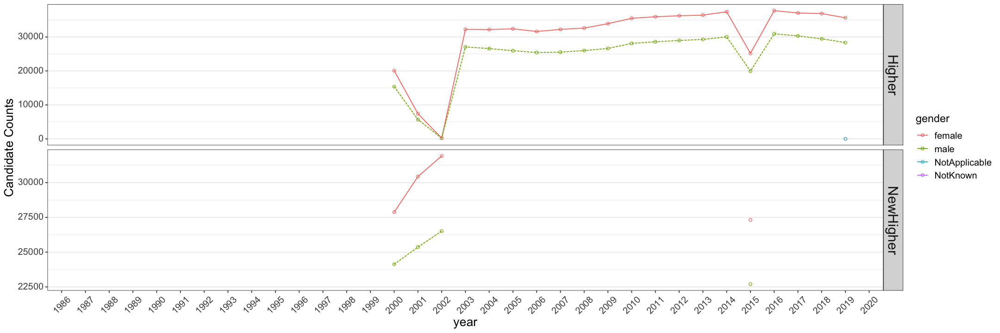

In [52]:
options(repr.plot.width = 18, repr.plot.height = 3) 

tmp_df %>%
    filter((qualification %in% c("AdvancedHigher")) & !(gender %in% c("all"))) %>%

    ggplot(aes(x = year, y = candidate_count, group = gender, colour = gender, linetype = gender), na.rm = TRUE) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_point(aes(colour = gender), pch = 21) + 
        
        ylab("Candidate Counts") + 
        scale_linetype(guide = FALSE) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))  +
        #facet_wrap(~qualification)
        facet_grid(qualification ~., scales = "free_y")



options(repr.plot.width = 18, repr.plot.height = 6) 

tmp_df %>%
    filter(!(qualification %in% c("AdvancedHigher")) & !(gender %in% c("all"))) %>%

    ggplot(aes(x = year, y = candidate_count, group = gender, colour = gender, linetype = gender), na.rm = TRUE) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_point(aes(colour = gender), pch = 21) + 
        
        ylab("Candidate Counts") + 
        scale_linetype(guide = FALSE) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))  +
        #facet_wrap(~qualification)
        facet_grid(qualification ~., scales = "free_y")



In [53]:
tmp_df <- tmp_df %>%

    full_join(demographics_total_subject_entries %>%
        select(year, (contains("Higher") & !contains("National"))) %>%

        pivot_longer(!year, names_to = "qualification", values_to = "total_subject_entries") %>%
        separate("qualification", c("gender", "qualification")) %>%
        mutate_at(c("gender", "qualification"), as.factor)
    ) %>%

    full_join(demographics_total_passes %>%
        select(year, (contains("Higher") & !contains("National"))) %>%

        pivot_longer(!year, names_to = "qualification", values_to = "total_passes") %>%
        separate("qualification", c("gender", "qualification")) %>%
        mutate_at(c("gender", "qualification"), as.factor)
    ) 

tmp_df %>%
    tail(20)

Joining, by = c("year", "gender", "qualification")

Joining, by = c("year", "gender", "qualification")



year,gender,qualification,candidate_count,total_subject_entries,total_passes
<fct>,<fct>,<fct>,<int>,<int>,<int>
2019,all,AdvancedHigher,13923,23465,18680
2019,male,AdvancedHigher,5916,10286,7925
2019,female,AdvancedHigher,8006,13178,10755
2019,NotKnown,AdvancedHigher,1,1,0
2019,NotApplicable,AdvancedHigher,0,0,NA
2020,all,Higher,NA,185844,146643
2020,male,Higher,NA,82380,71839
2020,female,Higher,NA,103828,94364
2020,NotKnown,Higher,NA,NA,NA


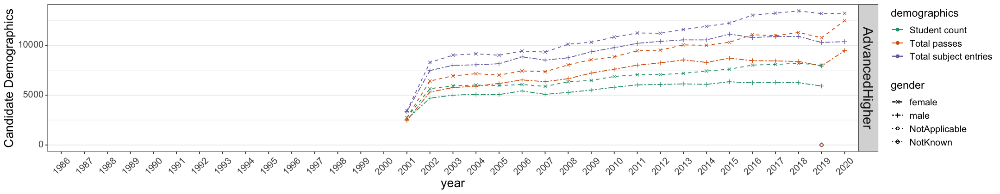

Warning message:
“`funs()` is deprecated as of dplyr 0.8.0.
Please use a list of either functions or lambdas: 

  # Simple named list: 
  list(mean = mean, median = median)

  # Auto named with `tibble::lst()`: 
  tibble::lst(mean, median)

  # Using lambdas
  list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”


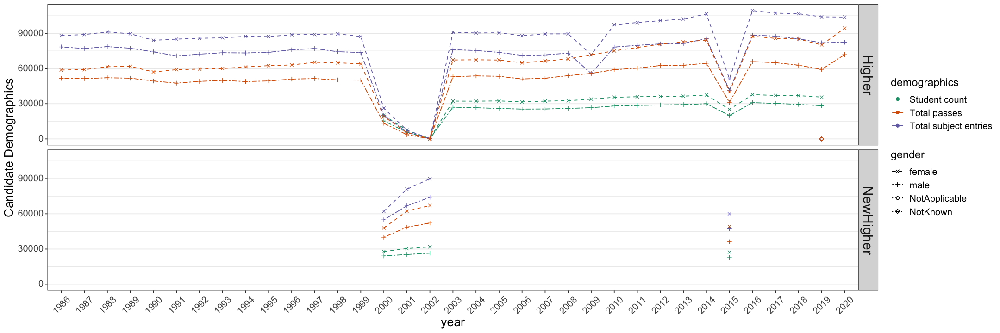

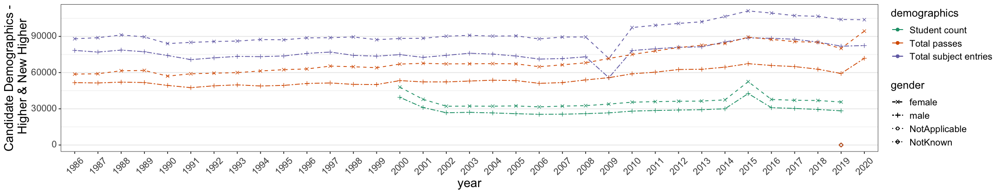

In [54]:
options(repr.plot.width = 18, repr.plot.height = 3.5) 

tmp_df %>%
    filter((qualification %in% c("AdvancedHigher")) & !(gender %in% c("all"))) %>%

    ggplot(aes(x = year, group = gender, shape = gender, linetype = gender), lineend = "round", linejoin = "round") + 
        geom_line(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_line(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_line(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 
        geom_point(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_point(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_point(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 

        ylab("Candidate Demographics") + 
        scale_linetype_manual(values = c(2, 6, 3, 4)) + #"dshed", "twodash", "dotted", "dotdash")) +
        scale_colour_brewer("demographics", palette = "Dark2") + #, direction = -1) +
        #scale_colour_manual("demographics", 
        #                    #breaks = c("candidate_count", "total_subject_entries", "total_passes"), # breaks plot ...
        #                    values = c("magenta", "maroon", "orange")) +
        scale_shape_manual(values = c(4, 3, 1, 5)) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) +
        facet_grid(qualification ~.) 


options(repr.plot.width = 18, repr.plot.height = 6) 

tmp_df %>%
    filter(!(qualification %in% c("AdvancedHigher")) & !(gender %in% c("all"))) %>%

    ggplot(aes(x = year, group = gender, shape = gender, linetype = gender), lineend = "round", linejoin = "round") + 
        geom_line(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_line(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_line(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 
        geom_point(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_point(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_point(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 

        ylab("Candidate Demographics") + 
        scale_linetype_manual(values = c(2, 6, 3, 4)) + #"dshed", "twodash", "dotted", "dotdash")) +
        scale_colour_brewer("demographics", palette = "Dark2") + #, direction = -1) +
        #scale_colour_manual("demographics", 
        #                    #breaks = c("candidate_count", "total_subject_entries", "total_passes"), # breaks plot ...
        #                    values = c("magenta", "maroon", "orange")) +
        scale_shape_manual(values = c(4, 3, 1, 5)) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) +
        facet_grid(qualification ~.) 



options(repr.plot.width = 18, repr.plot.height = 3.5) 

tmp_df %>%
    filter(!(qualification %in% c("AdvancedHigher")) & !(gender %in% c("all"))) %>%
    #drop_na(any_of(everything())) %>%
    group_by(year, gender) %>%

    summarise(candidate_count = sum(candidate_count, na.rm = TRUE),
              total_subject_entries = sum(total_subject_entries, na.rm = TRUE),
              total_passes = sum(total_passes, na.rm = TRUE)) %>%

    left_join(

        tmp_df %>%
            filter(!(qualification %in% c("AdvancedHigher")) & !(gender %in% c("all"))) %>%
            group_by(year, gender) %>%
            summarise_all(funs(sum(is.na(.)))) %>%

            select(-qualification) %>%
            #rowwise %>% 
            #mutate(count_nas = sum(across(where(is.numeric)))) %>%
            #mutate(across(where(is.numeric), ~ na_if(., 2))) # alt to next
            mutate(across(c("candidate_count", "total_subject_entries", "total_passes"), ~ na_if(., 2))) %>%
            rename_at(c("candidate_count", "total_subject_entries", "total_passes"), ~ paste0(.x, "_nas")) 
                                                                                    #paste0("nas_", .x))
      ) %>%
    suppressMessages() %>%

    mutate(candidate_count = ifelse(is.na(candidate_count_nas), NA, candidate_count),
           total_subject_entries = ifelse(is.na(total_subject_entries_nas), NA, total_subject_entries),
           total_passes = ifelse(is.na(total_passes_nas), NA, total_passes)) %>%

    select(-matches("_nas")) %>%

    ggplot(aes(x = year, group = gender, shape = gender, linetype = gender), lineend = "round", linejoin = "round") + 
        geom_line(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_line(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_line(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 
        geom_point(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_point(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_point(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 

        ylab("Candidate Demographics -\n Higher & New Higher") + 
        scale_linetype_manual(values = c(2, 6, 3, 4)) + #"dshed", "twodash", "dotted", "dotdash")) +
        scale_colour_brewer("demographics", palette = "Dark2") + #, direction = -1) +
        #scale_colour_manual("demographics", 
        #                    #breaks = c("candidate_count", "total_subject_entries", "total_passes"), # breaks plot ...
        #                    values = c("magenta", "maroon", "orange")) +
        scale_shape_manual(values = c(4, 3, 1, 5)) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


<p><br />&nbsp;</p>

### Run second set of filters, focus on National, then Intermediate variants

<p>&nbsp;</p>

In [55]:
demographics_candidates %>%
    select(year, matches("National\\d")) %>%
    tail

demographics_total_subject_entries %>%
    select(year, matches("National\\d")) %>%
    tail

demographics_total_passes %>%
    select(year, matches("National\\d")) %>%
    tail
           

year,all-National5,male-National5,female-National5,NotKnown-National5,NotApplicable-National5,all-National4,male-National4,female-National4,NotKnown-National4,⋯,all-National3,male-National3,female-National3,NotKnown-National3,NotApplicable-National3,all-National2,male-National2,female-National2,NotKnown-National2,NotApplicable-National2
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
2015,NA,NA,NA,NA,NA,53111,28377,24734,NA,⋯,10895,6389,4506,NA,NA,1072,675,397,NA,NA
2016,NA,NA,NA,NA,NA,53219,28499,24720,NA,⋯,11223,6529,4694,NA,NA,1297,832,465,NA,NA
2017,NA,NA,NA,NA,NA,51970,27567,24403,NA,⋯,10465,6081,4384,NA,NA,1122,703,419,NA,NA
2018,NA,NA,NA,NA,NA,46774,24763,22011,NA,⋯,10795,6354,4441,NA,NA,1213,783,430,NA,NA
2019,NA,NA,NA,NA,NA,46544,25029,21512,3,⋯,11380,6734,4645,1,NA,1202,802,400,NA,NA
2020,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


year,all-National5,male-National5,female-National5,NotKnown-National5,NotApplicable-National5,all-National4,male-National4,female-National4,NotKnown-National4,⋯,all-National3,male-National3,female-National3,NotKnown-National3,NotApplicable-National3,all-National2,male-National2,female-National2,NotKnown-National2,NotApplicable-National2
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
2015,NA,NA,NA,NA,NA,140151,78441,61710,NA,⋯,17525,10455,7070,NA,NA,1933,1212,721,NA,NA
2016,NA,NA,NA,NA,NA,131747,73643,58104,NA,⋯,18596,11292,7304,NA,NA,2465,1581,884,NA,NA
2017,NA,NA,NA,NA,NA,125649,70188,55461,NA,⋯,17282,10360,6922,NA,NA,1915,1190,725,NA,NA
2018,NA,NA,NA,NA,NA,109644,61471,48173,NA,⋯,17905,10845,7060,NA,NA,2105,1348,757,NA,NA
2019,NA,NA,NA,NA,NA,107999,61212,46783,4,⋯,19285,11804,7480,1,NA,2044,1359,685,0,0
2020,300344,146914,153708,NA,NA,103625,58155,45433,NA,⋯,21802,12891,8899,NA,NA,2015,1333,678,NA,NA


year,all-National5,male-National5,female-National5,NotKnown-National5,NotApplicable-National5,all-National4,male-National4,female-National4,NotKnown-National4,⋯,all-National3,male-National3,female-National3,NotKnown-National3,NotApplicable-National3,all-National2,male-National2,female-National2,NotKnown-National2,NotApplicable-National2
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
2015,NA,NA,NA,NA,NA,132041,73737,58304,NA,⋯,16072,9626,6446,NA,NA,1545,966,579,NA,NA
2016,NA,NA,NA,NA,NA,124141,69279,54862,NA,⋯,16894,10270,6624,NA,NA,1923,1216,707,NA,NA
2017,NA,NA,NA,NA,NA,117828,65663,52165,NA,⋯,15799,9425,6374,NA,NA,1594,991,603,NA,NA
2018,NA,NA,NA,NA,NA,101067,56587,44480,NA,⋯,16473,9985,6488,NA,NA,1740,1109,631,NA,NA
2019,NA,NA,NA,NA,NA,97221,54899,42318,4,⋯,17157,10482,6674,1,NA,1629,1079,550,NA,NA
2020,243572,128660,138884,NA,NA,94228,52691,41530,NA,⋯,19947,11786,8153,NA,NA,1518,1001,517,NA,NA


In [56]:

tmp_df <- demographics_candidates %>%
    select(year, matches("National\\d")) %>%

    pivot_longer(!year, names_to = "qualification", values_to = "candidate_count") %>%
    separate("qualification", c("gender", "qualification")) %>%
    mutate_at(c("gender", "qualification"), as.factor)

tmp_df %>%
    head()
tmp_df %>%
    filter(year != 2020) %>%
    tail(20)


year,gender,qualification,candidate_count
<fct>,<fct>,<fct>,<int>
1986,all,National5,NA
1986,male,National5,NA
1986,female,National5,NA
1986,NotKnown,National5,NA
1986,NotApplicable,National5,NA
1986,all,National4,NA


year,gender,qualification,candidate_count
<fct>,<fct>,<fct>,<int>
2019,all,National5,NA
2019,male,National5,NA
2019,female,National5,NA
2019,NotKnown,National5,NA
2019,NotApplicable,National5,NA
2019,all,National4,46544
2019,male,National4,25029
2019,female,National4,21512
2019,NotKnown,National4,3


In [57]:
tmp_df <- tmp_df %>%

    full_join(demographics_total_subject_entries %>%
        select(year, matches("National\\d")) %>%

        pivot_longer(!year, names_to = "qualification", values_to = "total_subject_entries") %>%
        separate("qualification", c("gender", "qualification")) %>%
        mutate_at(c("gender", "qualification"), as.factor)
    ) %>%

    full_join(demographics_total_passes %>%
        select(year, matches("National\\d")) %>%

        pivot_longer(!year, names_to = "qualification", values_to = "total_passes") %>%
        separate("qualification", c("gender", "qualification")) %>%
        mutate_at(c("gender", "qualification"), as.factor)
    ) 


tmp_df %>%
    filter(year != 2020) %>%
    tail(20)

Joining, by = c("year", "gender", "qualification")

Joining, by = c("year", "gender", "qualification")



year,gender,qualification,candidate_count,total_subject_entries,total_passes
<fct>,<fct>,<fct>,<int>,<int>,<int>
2019,all,National5,NA,NA,NA
2019,male,National5,NA,NA,NA
2019,female,National5,NA,NA,NA
2019,NotKnown,National5,NA,NA,NA
2019,NotApplicable,National5,NA,NA,NA
2019,all,National4,46544,107999,97221
2019,male,National4,25029,61212,54899
2019,female,National4,21512,46783,42318
2019,NotKnown,National4,3,4,4


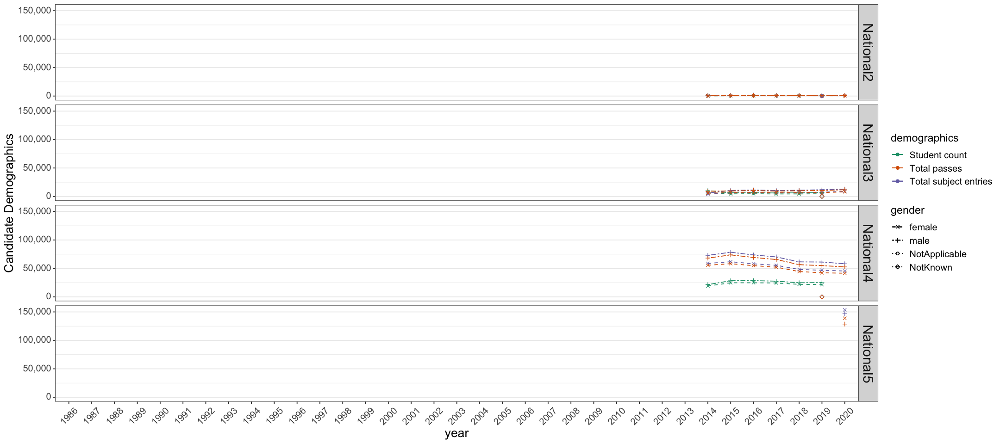

In [58]:

options(repr.plot.width = 18, repr.plot.height = 8) 

tmp_df %>%
    filter(!(gender %in% c("all"))) %>%

    ggplot(aes(x = year, group = gender, shape = gender, linetype = gender), lineend = "round", linejoin = "round") + 
        geom_line(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_line(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_line(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 
        geom_point(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_point(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_point(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 

        ylab("Candidate Demographics") + 
        scale_linetype_manual(values = c(2, 6, 3, 4)) + #"dshed", "twodash", "dotted", "dotdash")) +
        scale_colour_brewer("demographics", palette = "Dark2") + #, direction = -1) +
        #scale_colour_manual("demographics", 
        #                    #breaks = c("candidate_count", "total_subject_entries", "total_passes"), # breaks plot ...
        #                    values = c("magenta", "maroon", "orange")) +
        scale_shape_manual(values = c(4, 3, 1, 5)) +
        scale_y_continuous(labels = function(n) scales::comma(abs(n))) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) +
        facet_grid(qualification ~.)


In [59]:
demographics_candidates %>%
    select(year, matches("Intermediate\\d")) %>%
    tail

demographics_total_subject_entries %>%
    select(year, matches("Intermediate\\d")) %>%
    tail

demographics_total_passes %>%
    select(year, matches("Intermediate\\d")) %>%
    tail
           

year,all-Intermediate1,male-Intermediate1,female-Intermediate1,NotKnown-Intermediate1,NotApplicable-Intermediate1,all-Intermediate2,male-Intermediate2,female-Intermediate2,NotKnown-Intermediate2,NotApplicable-Intermediate2
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
2015,1394,708,686,NA,NA,7854,3850,4004,NA,NA
2016,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2017,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2018,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2019,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2020,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


year,all-Intermediate1,male-Intermediate1,female-Intermediate1,NotKnown-Intermediate1,NotApplicable-Intermediate1,all-Intermediate2,male-Intermediate2,female-Intermediate2,NotKnown-Intermediate2,NotApplicable-Intermediate2
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
2015,1553,792,761,NA,NA,10682,5227,5455,NA,NA
2016,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2017,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2018,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2019,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2020,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


year,all-Intermediate1,male-Intermediate1,female-Intermediate1,NotKnown-Intermediate1,NotApplicable-Intermediate1,all-Intermediate2,male-Intermediate2,female-Intermediate2,NotKnown-Intermediate2,NotApplicable-Intermediate2
<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
2015,1179,606,573,NA,NA,7858,3740,4118,NA,NA
2016,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2017,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2018,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2019,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
2020,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [60]:

tmp_df <- demographics_candidates %>%
    select(year, matches("Intermediate\\d")) %>%

    pivot_longer(!year, names_to = "qualification", values_to = "candidate_count") %>%
    separate("qualification", c("gender", "qualification")) %>%
    mutate_at(c("gender", "qualification"), as.factor) %>%

    full_join(demographics_total_subject_entries %>%
        select(year, matches("Intermediate\\d")) %>%

        pivot_longer(!year, names_to = "qualification", values_to = "total_subject_entries") %>%
        separate("qualification", c("gender", "qualification")) %>%
        mutate_at(c("gender", "qualification"), as.factor)
    ) %>%

    full_join(demographics_total_passes %>%
        select(year, matches("Intermediate\\d")) %>%

        pivot_longer(!year, names_to = "qualification", values_to = "total_passes") %>%
        separate("qualification", c("gender", "qualification")) %>%
        mutate_at(c("gender", "qualification"), as.factor)
    ) 


tmp_df %>%
    #filter(year != 2020) %>%
    head(20)

Joining, by = c("year", "gender", "qualification")

Joining, by = c("year", "gender", "qualification")



year,gender,qualification,candidate_count,total_subject_entries,total_passes
<fct>,<fct>,<fct>,<int>,<int>,<int>
1986,all,Intermediate1,NA,NA,NA
1986,male,Intermediate1,NA,NA,NA
1986,female,Intermediate1,NA,NA,NA
1986,NotKnown,Intermediate1,NA,NA,NA
1986,NotApplicable,Intermediate1,NA,NA,NA
1986,all,Intermediate2,NA,NA,NA
1986,male,Intermediate2,NA,NA,NA
1986,female,Intermediate2,NA,NA,NA
1986,NotKnown,Intermediate2,NA,NA,NA


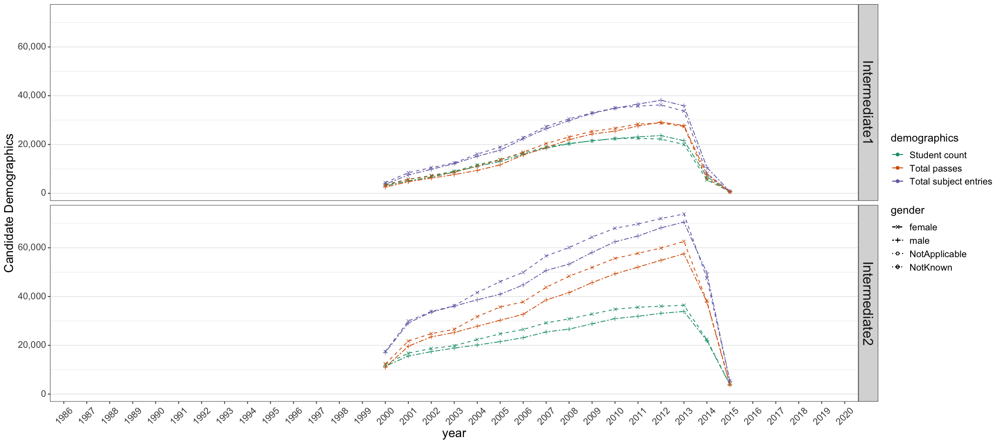

In [61]:

tmp_df %>%
    filter(!(gender %in% c("all"))) %>%

    ggplot(aes(x = year, group = gender, shape = gender, linetype = gender), lineend = "round", linejoin = "round") + 
        geom_line(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_line(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_line(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 
        geom_point(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_point(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_point(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 

        ylab("Candidate Demographics") + 
        scale_linetype_manual(values = c(2, 6, 3, 4, 5)) + #"dshed", "twodash", "dotted", "dotdash")) +
        scale_colour_brewer("demographics", palette = "Dark2") + #, direction = -1) +
        #scale_colour_manual("demographics", 
        #                    #breaks = c("candidate_count", "total_subject_entries", "total_passes"), # breaks plot ...
        #                    values = c("magenta", "maroon", "orange")) +
        scale_shape_manual(values = c(4, 3, 1, 5, 6)) +
        scale_y_continuous(labels = function(n) scales::comma(abs(n))) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) +
        facet_grid(qualification ~.) 

                           
rm(tmp_df)

In [62]:

sqa_candidate_census_1986_2020 <- demographics_candidates %>%

    pivot_longer(!year, names_to = "qualification", values_to = "candidate_count") %>%
    separate("qualification", c("gender", "qualification")) %>%
    mutate_at(c("gender", "qualification"), as.factor) %>%

    full_join(demographics_total_subject_entries %>%

        pivot_longer(!year, names_to = "qualification", values_to = "total_subject_entries") %>%
        separate("qualification", c("gender", "qualification")) %>%
        mutate_at(c("gender", "qualification"), as.factor)
    ) %>%

    full_join(demographics_total_passes %>%

        pivot_longer(!year, names_to = "qualification", values_to = "total_passes") %>%
        separate("qualification", c("gender", "qualification")) %>%
        mutate_at(c("gender", "qualification"), as.factor)
    ) %>%

    filter(!(qualification %in% c("HigherNational", "HNCS", "HNDS", "HigherNationalUnit", "HNPDA")))


dim(sqa_candidate_census_1986_2020)
sqa_candidate_census_1986_2020 %>%
    drop_na() %>%
    filter(year != 2020) %>%
    tail(20)

Joining, by = c("year", "gender", "qualification")

Joining, by = c("year", "gender", "qualification")



[1] 2100    6

year,gender,qualification,candidate_count,total_subject_entries,total_passes
<fct>,<fct>,<fct>,<int>,<int>,<int>
2019,all,Higher,63977,185917,139322
2019,male,Higher,28332,81900,59258
2019,female,Higher,35638,104005,80055
2019,NotKnown,Higher,4,7,7
2019,NotApplicable,Higher,3,5,2
2019,all,AdvancedHigher,13923,23465,18680
2019,male,AdvancedHigher,5916,10286,7925
2019,female,AdvancedHigher,8006,13178,10755
2019,NotKnown,AdvancedHigher,1,1,0


In [63]:
index_factors_sqa_candidate_census_1986_2020 <- sqa_candidate_census_1986_2020 %>%

    left_join(sqa_candidate_census_1986_2020 %>%
              
                  filter(year == base_year) %>%
                  mutate(base_year_census = candidate_count, 
                         base_year_subject_entries = total_subject_entries, 
                         base_year_passes = total_passes) %>%
                  select(gender, qualification, base_year_census, base_year_subject_entries, base_year_passes)
              ) %>%

    mutate(index_factor_candidate_count = candidate_count / base_year_census, 
           index_factor_subject_entries = total_subject_entries / base_year_subject_entries, 
           index_factor_passes  = total_passes / base_year_passes)
    
dim(index_factors_sqa_candidate_census_1986_2020)


Joining, by = c("gender", "qualification")



[1] 2100   12

In [64]:
index_factors_sqa_candidate_census_1986_2020 %>%
    drop_na %>%
    tail(20)

year,gender,qualification,candidate_count,total_subject_entries,total_passes,base_year_census,base_year_subject_entries,base_year_passes,index_factor_candidate_count,index_factor_subject_entries,index_factor_passes
<fct>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
2018,male,National3,6354,10845,9985,6389,10455,9626,0.9945218,1.0373027,1.0372948
2018,female,National3,4441,7060,6488,4506,7070,6446,0.9855748,0.9985856,1.0065157
2018,all,National2,1213,2105,1740,1072,1933,1545,1.1315299,1.0889809,1.1262136
2018,male,National2,783,1348,1109,675,1212,966,1.1600000,1.1122112,1.1480331
2018,female,National2,430,757,631,397,721,579,1.0831234,1.0499307,1.0898100
2019,all,Higher,63977,185917,139322,45121,92568,71295,1.4178985,2.0084370,1.9541623
2019,male,Higher,28332,81900,59258,19949,41421,31171,1.4202216,1.9772579,1.9010619
2019,female,Higher,35638,104005,80055,25172,51147,40124,1.4157794,2.0334526,1.9951899
2019,all,AdvancedHigher,13923,23465,18680,13943,23350,19007,0.9985656,1.0049251,0.9827958


In [65]:
index_factors_sqa_candidate_census_1986_2020 %>%
    filter(((year == 2015) | (year == 2018)) & (gender == "all"))


year,gender,qualification,candidate_count,total_subject_entries,total_passes,base_year_census,base_year_subject_entries,base_year_passes,index_factor_candidate_count,index_factor_subject_entries,index_factor_passes
<fct>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
2015,all,Higher,45121,92568,71295,45121,92568,71295,1.0000000,1.0000000,1.0000000
2015,all,NewHigher,50015,107301,85436,50015,107301,85436,1.0000000,1.0000000,1.0000000
2015,all,AdvancedHigher,13943,23350,19007,13943,23350,19007,1.0000000,1.0000000,1.0000000
2015,all,OrdinaryGrade,NA,NA,NA,NA,NA,NA,NA,NA,NA
2015,all,StandardGrade,NA,NA,NA,NA,NA,NA,NA,NA,NA
2015,all,CSYS,NA,NA,NA,NA,NA,NA,NA,NA,NA
2015,all,National5,NA,NA,NA,NA,NA,NA,NA,NA,NA
2015,all,National4,53111,140151,132041,53111,140151,132041,1.0000000,1.0000000,1.0000000
2015,all,National3,10895,17525,16072,10895,17525,16072,1.0000000,1.0000000,1.0000000


In [66]:
tmp_df <- index_factors_sqa_candidate_census_1986_2020 %>%

    pivot_longer(starts_with(regex("base_year_")), names_to = "base_year_demographic", values_to = "count") %>%
    select(-starts_with("index_factor_")) %>%

    left_join(index_factors_sqa_candidate_census_1986_2020 %>%
                pivot_longer(starts_with(regex("index_factor_")), names_to = "index_factor", values_to = "factor") %>%
                select(-starts_with("base_year_"))
    )

tmp_df %>%
    filter((year == 2015) & (gender == "all")) %>%
    head(12)
           
tmp_df %>%
    filter((year == 2018) & (gender == "all")) %>%
    head(12)



Joining, by = c("year", "gender", "qualification", "candidate_count", "total_subject_entries", "total_passes")



year,gender,qualification,candidate_count,total_subject_entries,total_passes,base_year_demographic,count,index_factor,factor
<fct>,<fct>,<fct>,<int>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
2015,all,Higher,45121,92568,71295,base_year_census,45121,index_factor_candidate_count,1
2015,all,Higher,45121,92568,71295,base_year_census,45121,index_factor_subject_entries,1
2015,all,Higher,45121,92568,71295,base_year_census,45121,index_factor_passes,1
2015,all,Higher,45121,92568,71295,base_year_subject_entries,92568,index_factor_candidate_count,1
2015,all,Higher,45121,92568,71295,base_year_subject_entries,92568,index_factor_subject_entries,1
2015,all,Higher,45121,92568,71295,base_year_subject_entries,92568,index_factor_passes,1
2015,all,Higher,45121,92568,71295,base_year_passes,71295,index_factor_candidate_count,1
2015,all,Higher,45121,92568,71295,base_year_passes,71295,index_factor_subject_entries,1
2015,all,Higher,45121,92568,71295,base_year_passes,71295,index_factor_passes,1


year,gender,qualification,candidate_count,total_subject_entries,total_passes,base_year_demographic,count,index_factor,factor
<fct>,<fct>,<fct>,<int>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
2018,all,Higher,66336,191952,147949,base_year_census,45121,index_factor_candidate_count,1.470180
2018,all,Higher,66336,191952,147949,base_year_census,45121,index_factor_subject_entries,2.073632
2018,all,Higher,66336,191952,147949,base_year_census,45121,index_factor_passes,2.075167
2018,all,Higher,66336,191952,147949,base_year_subject_entries,92568,index_factor_candidate_count,1.470180
2018,all,Higher,66336,191952,147949,base_year_subject_entries,92568,index_factor_subject_entries,2.073632
2018,all,Higher,66336,191952,147949,base_year_subject_entries,92568,index_factor_passes,2.075167
2018,all,Higher,66336,191952,147949,base_year_passes,71295,index_factor_candidate_count,1.470180
2018,all,Higher,66336,191952,147949,base_year_passes,71295,index_factor_subject_entries,2.073632
2018,all,Higher,66336,191952,147949,base_year_passes,71295,index_factor_passes,2.075167


In [67]:
colnames(index_factors_sqa_candidate_census_1986_2020)

[1] "year"                         "gender"                      
 [3] "qualification"                "candidate_count"             
 [5] "total_subject_entries"        "total_passes"                
 [7] "base_year_census"             "base_year_subject_entries"   
 [9] "base_year_passes"             "index_factor_candidate_count"
[11] "index_factor_subject_entries" "index_factor_passes"

median,mean,min,max,median_base_year_census,mean_base_year_census
<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>
19891,24769.88,0,444888,7729,15283.75


Warning message:
“Removed 308 row(s) containing missing values (geom_path).”
Warning message:
“Removed 315 row(s) containing missing values (geom_path).”


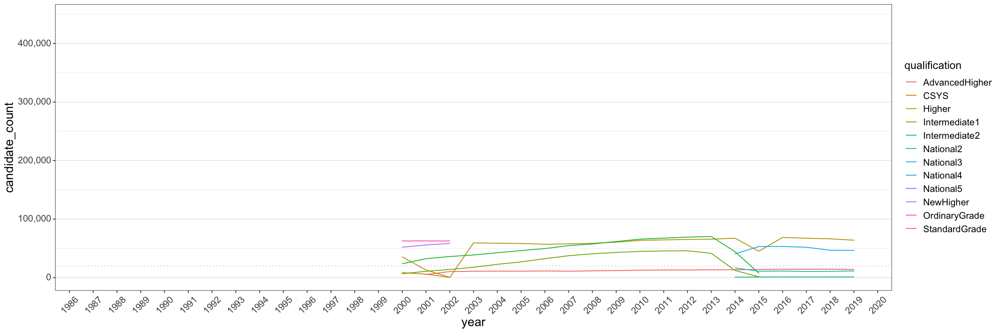

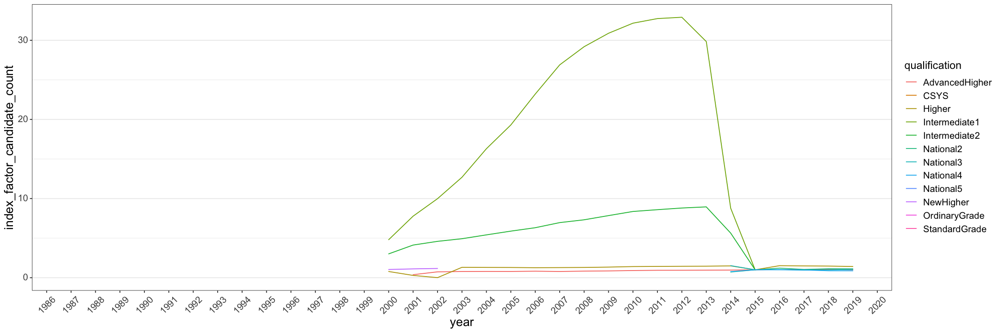

In [68]:
summary_lines <- index_factors_sqa_candidate_census_1986_2020 %>%
    summarise(
        median = median(candidate_count, na.rm = TRUE),
        mean = mean(candidate_count, na.rm = TRUE),
        min = min(candidate_count, na.rm = TRUE),
        max = max(candidate_count, na.rm = TRUE),
        median_base_year_census = median(base_year_census, na.rm = TRUE),
        mean_base_year_census = mean(base_year_census, na.rm = TRUE),
        median_index_factor = median(index_factor_candidate_count, na.rm = TRUE)
    )
summary_lines


options(repr.plot.width = 18, repr.plot.height = 6)

index_factors_sqa_candidate_census_1986_2020 %>%
    filter(gender == "all") %>%

    ggplot(aes(x = year, y = candidate_count, group = qualification, colour = qualification)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        geom_hline(aes(yintercept = summary_lines$median), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        expand_limits(y = 0) + 
        
        scale_y_continuous(labels = scales::comma) + #stop auto-conversion to scientific mode
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


index_factors_sqa_candidate_census_1986_2020 %>%
    filter(gender == "all") %>%

    ggplot(aes(x = year, y = index_factor_candidate_count, group = qualification, colour = qualification)) +  
        geom_line(lineend = 'round', linejoin = 'round') + 
        #geom_hline(aes(yintercept = summary_lines$median_base_year_census), colour = "maroon", alpha = 0.35, linetype = "dotted") +
        
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5))


Warning message:
“Removed 320 rows containing non-finite values (stat_density).”
Warning message:
“Removed 320 rows containing non-finite values (stat_bin).”


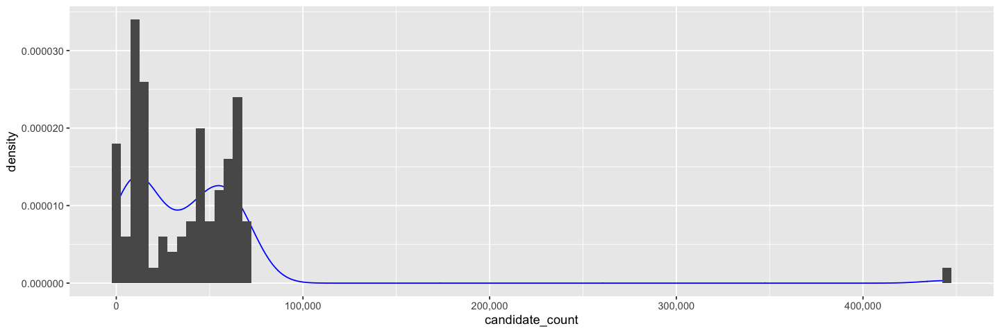

In [78]:
options(repr.plot.width = 12, repr.plot.height = 4)

index_factors_sqa_candidate_census_1986_2020 %>%
    filter(gender %in% c("all")) %>%
    
    ggplot(aes(candidate_count)) +
        geom_density(colour = "blue") + 
        geom_histogram(aes(y = stat(density)), binwidth = 5000) +
        scale_x_continuous(labels = scales::comma) +
        scale_y_continuous(labels = scales::comma)


In [69]:
head(index_factors_sqa_candidate_census_1986_2020)

year,gender,qualification,candidate_count,total_subject_entries,total_passes,base_year_census,base_year_subject_entries,base_year_passes,index_factor_candidate_count,index_factor_subject_entries,index_factor_passes
<fct>,<fct>,<fct>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
1986,all,Higher,NA,166403,110390,45121,92568,71295,NA,1.797630,1.548355
1986,male,Higher,NA,78372,51655,19949,41421,31171,NA,1.892084,1.657149
1986,female,Higher,NA,88031,58735,25172,51147,40124,NA,1.721137,1.463837
1986,NotKnown,Higher,NA,NA,NA,NA,NA,NA,NA,NA,NA
1986,NotApplicable,Higher,NA,NA,NA,NA,NA,NA,NA,NA,NA
1986,all,NewHigher,NA,NA,NA,50015,107301,85436,NA,NA,NA


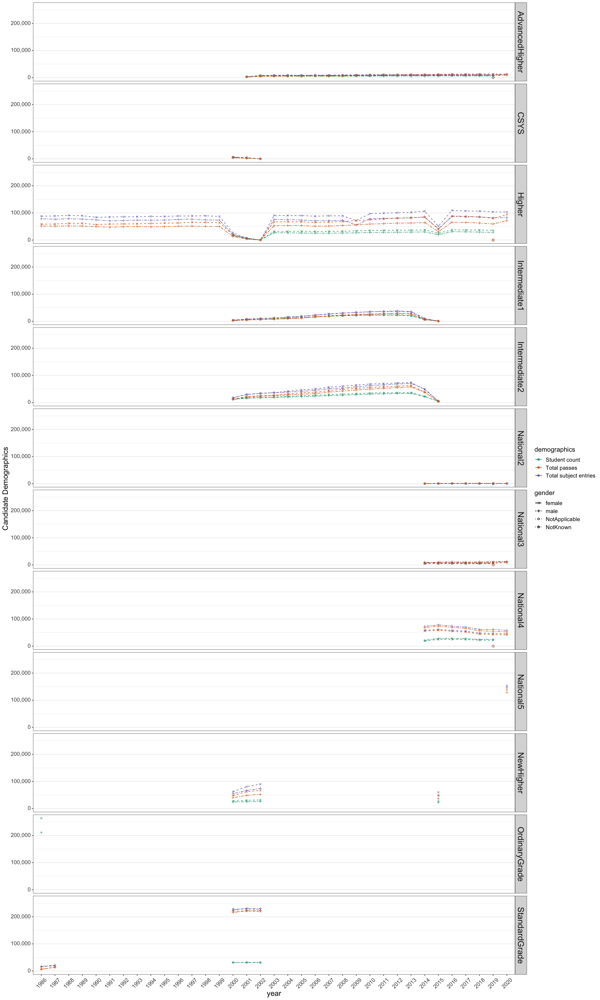

In [96]:
options(repr.plot.width = 18, repr.plot.height = 30)


index_factors_sqa_candidate_census_1986_2020 %>%
    filter(!(gender %in% c("all"))) %>%

    ggplot(aes(x = year, group = gender, shape = gender, linetype = gender), lineend = "round", linejoin = "round") + 
        geom_line(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_line(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_line(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 
        geom_point(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_point(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_point(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 

        ylab("Candidate Demographics") + 
        scale_linetype_manual(values = c(2, 6, 3, 4, 5)) + #"dshed", "twodash", "dotted", "dotdash")) +
        scale_colour_brewer("demographics", palette = "Dark2") + #, direction = -1) +
        scale_shape_manual(values = c(4, 3, 1, 5, 6)) +
        scale_y_continuous(labels = function(n) scales::comma(abs(n))) +
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) +
        facet_grid(qualification ~.) 

         

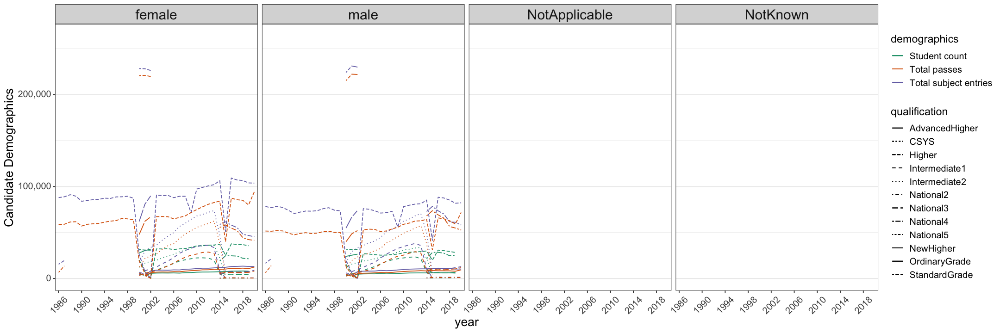

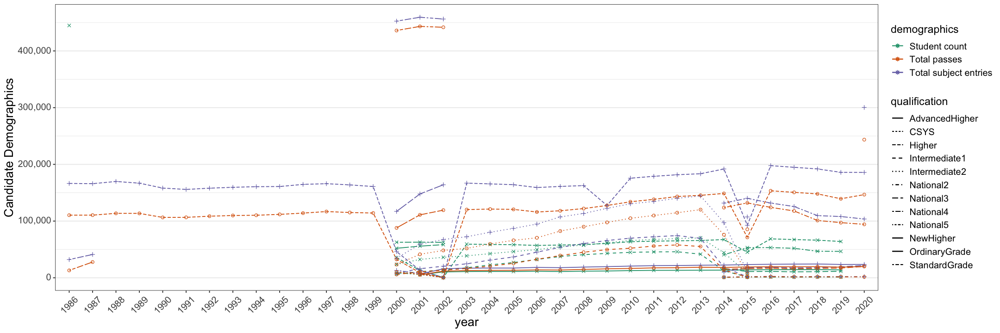

In [104]:
options(repr.plot.width = 18, repr.plot.height = 6)


index_factors_sqa_candidate_census_1986_2020 %>%
    filter(!(gender %in% c("all"))) %>%

    ggplot(aes(x = year, group = qualification, linetype = qualification), lineend = "round", linejoin = "round") + 
        geom_line(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_line(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_line(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 
        #geom_point(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        #geom_point(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        #geom_point(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 

        ylab("Candidate Demographics") + 
        #scale_linetype_manual(values = c(2, 6, 3, 4, 5)) + #"dshed", "twodash", "dotted", "dotdash")) +
        scale_colour_brewer("demographics", palette = "Dark2") + #, direction = -1) +
        #scale_shape_manual(values = c(4, 3, 1, 5, 6)) +
        scale_y_continuous(labels = function(n) scales::comma(abs(n))) +
        scale_x_discrete(breaks = seq(min(as.character(index_factors_sqa_candidate_census_1986_2020$year)), 
                                           max(as.character(index_factors_sqa_candidate_census_1986_2020$year)), 
                                           4)) + 
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) +
        facet_grid(. ~ gender) 

 
index_factors_sqa_candidate_census_1986_2020 %>%
    filter(gender %in% c("all")) %>%

    ggplot(aes(x = year, group = qualification, linetype = qualification), lineend = "round", linejoin = "round") +
        geom_line(aes(y = candidate_count, colour = "Student count"), na.rm = TRUE) + 
        geom_line(aes(y = total_subject_entries, colour = "Total subject entries"), na.rm = TRUE) + 
        geom_line(aes(y = total_passes, colour = "Total passes"), na.rm = TRUE) + 
        geom_point(aes(y = candidate_count, colour = "Student count"), shape = 4, na.rm = TRUE) + 
        geom_point(aes(y = total_subject_entries, colour = "Total subject entries"), shape = 3, na.rm = TRUE) + 
        geom_point(aes(y = total_passes, colour = "Total passes"), shape = 1, na.rm = TRUE) + 

        ylab("Candidate Demographics") + 
        #scale_linetype_manual(values = c(2, 6, 3, 4, 5)) + #"dshed", "twodash", "dotted", "dotdash")) +
        scale_colour_brewer("demographics", palette = "Dark2") + #, direction = -1) +
        #scale_shape_manual(values = c(4, 3, 1, 5, 6)) +
        scale_y_continuous(labels = function(n) scales::comma(abs(n))) +
        #scale_x_discrete(breaks = seq(min(as.character(index_factors_sqa_candidate_census_1986_2020$year)), 
        #                                   max(as.character(index_factors_sqa_candidate_census_1986_2020$year)), 
        #                                   4)) + 
        dressCodeTheme +
        theme(axis.text.x = element_text(angle = 45, vjust = 0.5)) #+
        #facet_grid(. ~ gender) 
        

* __indices not really useful - too much inconsistency__